In [1]:
from datetime import date
import os

from IPython.display import display
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd


In [2]:
data_path = r'../data/amazon-data-phase-1-download/'
filepaths = [data_path+f for f in os.listdir(data_path) if f.endswith('.csv')]
print('%s total files to read' % len(filepaths))

2767 total files to read


In [3]:
filepaths[:3]

['../data/amazon-data-phase-1-download/R_hrzkhELGx5jezT7_R_3I9Pu8iauEcOx9A.csv',
 '../data/amazon-data-phase-1-download/R_c2JhEelp5x2LnDO_R_7UtikIBqeQHvnyN.csv',
 '../data/amazon-data-phase-1-download/R_P6kp2IRxc0vVrqu_R_1Nnv2IYQFpUwHrr.csv']

In [4]:
# expected based on other notebook about behavioral
N = 3319
share_rate = 0.817
expected = share_rate * N
print('expected: %s'%expected)

expected: 2711.623


We have more files than those submitted by Prolific participants. May need to do some data cleaning

## Set up

```
categories: dictionary

category_frequencies_df: time series of number of purchases
category_price_median_df: time series of median price for each month
category_price_90p_df: time series of 90% highest price each month
category_price_10p_df: time series of 10% highest price each month
```

Notes:
- purchase price in the CSV is per unit, not the total. So even when quantity > 1, it indicates price for quantity=1

Questions:
- is median best?

In [5]:
"""
categories = {category_name: {'yyyyy-mm': [price for price of each purchase], for each year-month} for each category}
"""

def get_yyyy_mm_list():
    """
    Returns list of 'yyyy-mm' for 2018-01 through 2022-12
    """
    years = ['2018','2019','2020','2021','2022']
    months = list(range(1,13))
    yyyy_mm_list = []
    for year in years:
        for month in months:
            yyyy_mm_list += [year+'-'+'{0:0>2}'.format(month)]
    return yyyy_mm_list

yyyy_mm_list = get_yyyy_mm_list()

def get_category_dict():
    return {yyyy_mm:[] for yyyy_mm in yyyy_mm_list}

In [6]:
categories = dict()
# files_read = 0
files_used = 0
total_purchases = 0

for i, f in enumerate(filepaths):
    if i%500 == 0:
        print('%s: reading file %s - %s files used; %s total purchases' % 
              (pd.Timestamp.now(), i, files_used, total_purchases))
    df = pd.read_csv(f, parse_dates=['Order Date'])
    # Only use data with purchses that begin in 2018 and end in 2022
    if (df['Order Date'].min() > pd.Timestamp('2018-12-31')) | (df['Order Date'].max() < pd.Timestamp('2022-01-01')):
        continue
    files_used += 1
    for index, row in df.iterrows():
        if (row['Order Date'] < pd.Timestamp('2018-01-01')) | (row['Order Date'] > pd.Timestamp('2022-12-31')):
            continue
        # skip rows where purchase price is 0 or undefined (NaN)
        if row.isna()['Purchase Price Per Unit'] or ('$' not in row['Purchase Price Per Unit']):
            continue
        yyyy_mm = date.strftime(row['Order Date'], '%Y-%m')
        category = row['Category']
        price = float(row['Purchase Price Per Unit'].strip('$').replace(',',''))
        if price == 0:
            continue
        if category not in categories:
            categories[category] = get_category_dict()
        categories[category][yyyy_mm] += [price]
        
    total_purchases += index

2023-03-01 13:24:46.311981: reading file 0 - 0 files used; 0 total purchases
2023-03-01 13:25:24.800721: reading file 500 - 418 files used; 173896 total purchases
2023-03-01 13:26:03.627432: reading file 1000 - 838 files used; 347623 total purchases
2023-03-01 13:26:41.274927: reading file 1500 - 1271 files used; 512667 total purchases
2023-03-01 13:27:24.522191: reading file 2000 - 1697 files used; 683893 total purchases
2023-03-01 13:28:04.472504: reading file 2500 - 2113 files used; 848316 total purchases


In [7]:
len(categories)

1789

In [8]:
# print(category)
# categories[category]

In [9]:
categories_total_purchases = dict()
for c, values in categories.items():
    p = 0
    for yyyy_mm, purchases in values.items():
        p += len(purchases)
    categories_total_purchases[c] = p

In [10]:
print('All categories, unfiltered')
categories_total_purchases_df = pd.DataFrame({
    'category':list(categories_total_purchases.keys()),
    'total purchases': list(categories_total_purchases.values()),
}).sort_values('total purchases', ascending=False)
categories_total_purchases_df.head(10)

All categories, unfiltered


,category,total purchases
1,NaN,46208
0,ABIS_BOOK,45563
26,PET_FOOD,21389
39,GIFT_CARD,16359
15,SHIRT,13642
78,NUTRITIONAL_SUPPLEMENT,13580
21,HEALTH_PERSONAL_CARE,10992
197,ELECTRONIC_CABLE,9113
149,GROCERY,8366
57,MEDICATION,8277


In [11]:
categories_total_purchases_df.describe().round(2)

,total purchases
count,1789.00
mean,527.93
std,1952.46
min,1.00
25%,32.00
50%,112.00
75%,386.00
max,46208.00


Filter the categories data to categories with at least THRESHOLD PURCHASES every month

In [12]:
MONTHLY_THRESHOLD = 20
filtered_categories = dict()
for category, cat_data in categories.items():
    keep_cat = True
    for _, purchases in cat_data.items():
        if len(purchases) < MONTHLY_THRESHOLD:
            keep_cat = False
            break
    if keep_cat:
        filtered_categories[category] = cat_data

In [13]:
print('Filtered categories: total purchases')
filtered_total_purchases = {c:p for (c,p) in categories_total_purchases.items() if c in filtered_categories}
filtered_total_purchases_df = pd.DataFrame({
    'category':list(filtered_total_purchases.keys()),
    'total purchases': list(filtered_total_purchases.values()),
}).sort_values('total purchases', ascending=False)
filtered_total_purchases_df.head(10)

Filtered categories: total purchases


,category,total purchases
1,NaN,46208
0,ABIS_BOOK,45563
7,PET_FOOD,21389
8,GIFT_CARD,16359
4,SHIRT,13642
17,NUTRITIONAL_SUPPLEMENT,13580
6,HEALTH_PERSONAL_CARE,10992
37,ELECTRONIC_CABLE,9113
29,GROCERY,8366
14,MEDICATION,8277


In [14]:
filtered_total_purchases_df.describe().round(2)

,total purchases
count,41.00
mean,8538.46
std,9371.19
min,2828.00
25%,4177.00
50%,5741.00
75%,8082.00
max,46208.00


In [17]:
"""
category_frequency_df: time series of number of purchases
category_price_median_df: time series of mean price for each month
category_price_90p_df: time series of 90% highest price each month
category_price_10p_df: time series of 10% highest price each month

each one has columns:
yyyy-mm, categoryA, categoryB, ... 


"""
category_frequency = dict()
category_price_median = dict()
category_price_90p = dict()
category_price_10p = dict()
for cat, data in filtered_categories.items():
    category_frequency[cat] = [len(data[yyyy_mm]) for yyyy_mm in yyyy_mm_list]
    category_price_median[cat] = [np.median(data[yyyy_mm]) for yyyy_mm in yyyy_mm_list]
    category_price_10p[cat] = [np.percentile(data[yyyy_mm], 10) for yyyy_mm in yyyy_mm_list]
    category_price_90p[cat] = [np.percentile(data[yyyy_mm], 90) for yyyy_mm in yyyy_mm_list]

idx = pd.Index(yyyy_mm_list, name='yyyy-mm')
category_price_median_df = pd.DataFrame(category_price_median, index=idx)
category_price_10p_df = pd.DataFrame(category_price_10p, index=idx)
category_price_90p_df = pd.DataFrame(category_price_90p, index=idx)
# Limit frequency analysis to 2022-10 because that's when we started collecting data
category_frequency_df = pd.DataFrame(category_frequency, index=idx).loc[:'2022-10']

## Plot purchase frequencies

Notes:
- Handling books separately because of the higher volume


Observations:
- Books have a seasonality: many purchases in December (holiday gifts) + August (for school?)

In [18]:
category_frequency_df.head()

,ABIS_BOOK,NaN,TOYS_AND_GAMES,SOCKS,SHIRT,SKIN_CLEANING_AGENT,HEALTH_PERSONAL_CARE,PET_FOOD,GIFT_CARD,HEADPHONES,...,COFFEE,VITAMIN,DRESS,PET_SUPPLIES,TOILET_PAPER,BATTERY,ELECTRONIC_CABLE,CHARGING_ADAPTER,PHYSICAL_VIDEO_GAME_SOFTWARE,DRINKING_CUP
yyyy-mm,,,,,,,,,,,,,,,,,,,,,
2018-01,1023,1139,62,44,84,52,142,217,194,62,...,37,58,34,91,40,62,120,39,77,49
2018-02,558,969,60,33,83,47,139,199,154,67,...,54,52,32,61,26,49,109,38,59,29
2018-03,636,1127,95,44,106,60,136,233,170,59,...,42,55,55,85,25,46,119,24,78,37
2018-04,607,973,61,49,75,49,136,249,136,64,...,43,45,46,56,23,33,89,33,47,36
2018-05,643,1054,68,44,164,51,106,224,159,51,...,41,57,54,74,38,45,109,38,52,34


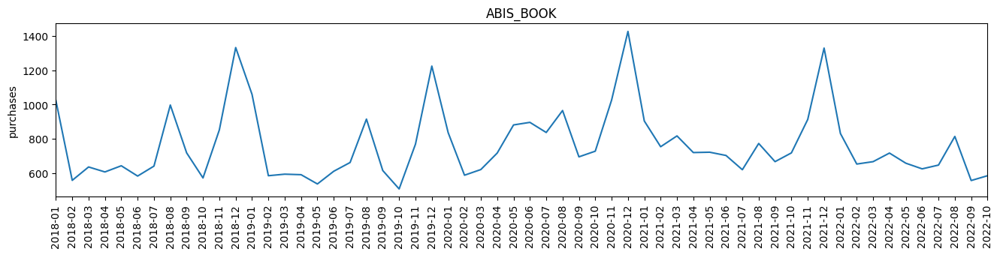

In [19]:
category = 'ABIS_BOOK'
fig,ax = plt.subplots(figsize=(16,3))
ax.plot(category_frequency_df[category])
ax.set_xlim('2018-01', '2022-10')
ax.set_ylabel('purchases')
ax.set_title(category)
_ = plt.xticks(rotation = 90)

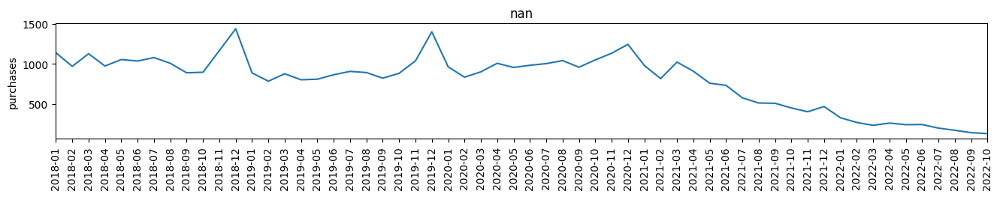

In [20]:
"""
Watch out for NaN...
"""
category = np.nan
fig,ax = plt.subplots(figsize=(16,2))
ax.plot(category_frequency_df[category])
ax.set_xlim('2018-01', '2022-10')
ax.set_ylabel('purchases')
ax.set_title(category)
_ = plt.xticks(rotation = 90)

There are lots of categories. Need some way to separate them. Like subcategories...

In [21]:
# Need to categorize / separate the items
print(list(filtered_categories.keys()))

['ABIS_BOOK', nan, 'TOYS_AND_GAMES', 'SOCKS', 'SHIRT', 'SKIN_CLEANING_AGENT', 'HEALTH_PERSONAL_CARE', 'PET_FOOD', 'GIFT_CARD', 'HEADPHONES', 'PANTS', 'UNDERPANTS', 'SNACK_FOOD_BAR', 'SHOES', 'MEDICATION', 'CELLULAR_PHONE_CASE', 'HOME', 'NUTRITIONAL_SUPPLEMENT', 'CLEANING_AGENT', 'TEA', 'SKIN_MOISTURIZER', 'BEAUTY', 'TOY_FIGURE', 'TABLETOP_GAME', 'SCREEN_PROTECTOR', 'WRITING_INSTRUMENT', 'PORTABLE_ELECTRONIC_DEVICE_COVER', 'HERBAL_SUPPLEMENT', 'SPORTING_GOODS', 'GROCERY', 'KITCHEN', 'COFFEE', 'VITAMIN', 'DRESS', 'PET_SUPPLIES', 'TOILET_PAPER', 'BATTERY', 'ELECTRONIC_CABLE', 'CHARGING_ADAPTER', 'PHYSICAL_VIDEO_GAME_SOFTWARE', 'DRINKING_CUP']


In [22]:
cat_electronics = [
    'CELLULAR_PHONE_CASE', 'HEADPHONES', 'SCREEN_PROTECTOR', 'PORTABLE_ELECTRONIC_DEVICE_COVER', 
    'BATTERY', 'ELECTRONIC_CABLE', 'CHARGING_ADAPTER', 'PHYSICAL_VIDEO_GAME_SOFTWARE'
]
cat_apparel = ['SOCKS', 'SHIRT', 'PANTS', 'UNDERPANTS', 'SHOES','DRESS']
cat_eat_drink = [
    'SNACK_FOOD_BAR', 'NUTRITIONAL_SUPPLEMENT', 'TEA',
    'HERBAL_SUPPLEMENT', 'GROCERY', 'COFFEE', 'VITAMIN'
]
cat_health_beauty = [
    'SKIN_MOISTURIZER', 'BEAUTY','MEDICATION', 'HEALTH_PERSONAL_CARE'
]
cat_cleaning = ['SKIN_CLEANING_AGENT', 'CLEANING_AGENT']
cat_toys = ['TOY_FIGURE', 'TABLETOP_GAME','TOYS_AND_GAMES']
cat_misc = [c for c in filtered_categories.keys() if ((c not in ['ABIS_BOOK', np.nan] + cat_electronics + cat_apparel + cat_eat_drink + cat_health_beauty + cat_toys))]
subcategories = {
    'Electronics': cat_electronics,
    'Apparel': cat_apparel,
    'Eat/Drink': cat_eat_drink,
    'Health/Beauty': cat_health_beauty,
    'Cleaning': cat_cleaning,
    'Toys/Games': cat_toys,
    'misc': cat_misc
}

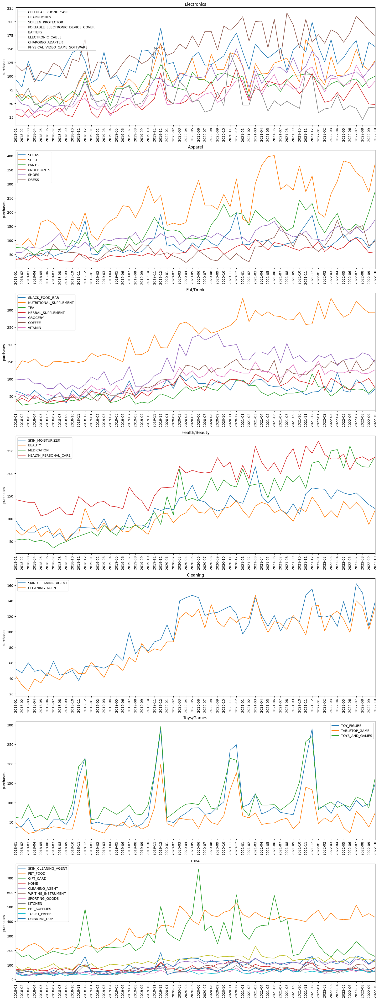

In [23]:
fig,axes = plt.subplots(len(subcategories), 1, figsize=(16,len(subcategories)*6))

for i, (subcategies_name, cats) in enumerate(subcategories.items()):
    ax = axes[i]
    for c, category in enumerate(cats): 
        ax.plot(category_frequency_df[category], label=category)
    ax.set_title(subcategies_name)
    ax.set_xlim('2018-01', '2022-10')
    ax.set_ylabel('purchases')
    [tick.set_rotation(90) for tick in ax.get_xticklabels()]

    ax.legend()
plt.tight_layout()

## Prices

In [24]:
category_price_median_df.head()

,ABIS_BOOK,NaN,TOYS_AND_GAMES,SOCKS,SHIRT,SKIN_CLEANING_AGENT,HEALTH_PERSONAL_CARE,PET_FOOD,GIFT_CARD,HEADPHONES,...,COFFEE,VITAMIN,DRESS,PET_SUPPLIES,TOILET_PAPER,BATTERY,ELECTRONIC_CABLE,CHARGING_ADAPTER,PHYSICAL_VIDEO_GAME_SOFTWARE,DRINKING_CUP
yyyy-mm,,,,,,,,,,,,,,,,,,,,,
2018-01,11.99,13.90,12.990,10.745,15.935,6.990,10.990,12.39,25.00,19.990,...,19.000,14.01,17.485,14.89,17.520,8.99,8.445,13.99,32.970,13.99
2018-02,10.57,13.96,12.485,11.990,14.990,8.940,11.600,12.59,20.00,16.990,...,14.925,11.70,15.990,16.58,14.105,8.99,7.990,17.09,29.990,13.00
2018-03,9.95,14.50,12.990,12.795,15.990,10.585,12.440,13.20,19.99,17.950,...,17.635,15.99,13.990,12.99,16.970,6.99,8.790,12.42,32.015,12.99
2018-04,10.40,14.99,12.350,11.880,14.990,11.000,11.985,13.20,25.00,16.055,...,15.870,14.24,19.990,12.97,21.990,8.99,8.990,11.99,39.990,14.99
2018-05,11.01,14.95,10.995,13.990,15.990,12.990,12.090,13.32,25.00,17.990,...,17.990,12.33,25.990,12.99,20.195,11.99,8.990,13.02,32.965,14.99


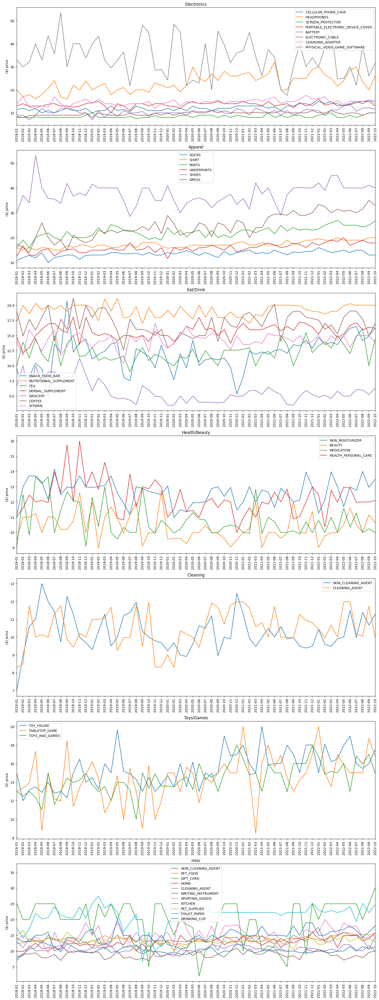

In [25]:
fig,axes = plt.subplots(len(subcategories), 1, figsize=(16,len(subcategories)*6))

for i, (subcategies_name, cats) in enumerate(subcategories.items()):
    ax = axes[i]
    for c, category in enumerate(cats): 
        ax.plot(category_price_median_df[category], label=category)
    ax.set_title(subcategies_name)
    ax.set_xlim('2018-01', '2022-10')
    ax.set_ylabel('($) price')
    [tick.set_rotation(90) for tick in ax.get_xticklabels()]

    ax.legend()
plt.tight_layout()

In [26]:
category_price_10p_df.head()

,ABIS_BOOK,NaN,TOYS_AND_GAMES,SOCKS,SHIRT,SKIN_CLEANING_AGENT,HEALTH_PERSONAL_CARE,PET_FOOD,GIFT_CARD,HEADPHONES,...,COFFEE,VITAMIN,DRESS,PET_SUPPLIES,TOILET_PAPER,BATTERY,ELECTRONIC_CABLE,CHARGING_ADAPTER,PHYSICAL_VIDEO_GAME_SOFTWARE,DRINKING_CUP
yyyy-mm,,,,,,,,,,,,,,,,,,,,,
2018-01,4.856,4.988,6.212,7.936,8.286,3.610,4.963,4.990,3.000,5.378,...,5.986,6.679,4.269,5.940,6.948,4.292,5.781,6.780,14.292,4.932
2018-02,4.665,5.990,5.920,7.798,8.182,2.686,5.326,5.990,3.000,6.140,...,5.990,5.731,5.375,3.740,5.980,4.910,5.290,8.684,11.640,6.362
2018-03,3.920,5.648,4.990,8.704,8.990,4.303,5.140,4.974,2.870,4.880,...,5.264,7.974,8.154,4.990,6.252,3.645,5.982,7.221,9.858,6.110
2018-04,4.202,6.606,5.990,7.790,7.498,5.650,5.560,4.778,3.000,8.017,...,3.620,8.550,7.745,5.265,6.198,4.330,5.698,7.906,18.190,6.640
2018-05,4.200,6.520,5.767,7.009,9.990,4.790,5.935,4.955,1.392,8.610,...,5.720,7.982,12.850,5.413,6.990,5.712,5.372,7.990,16.632,7.279


In [27]:
filtered_total_purchases_df

,category,total purchases
1,NaN,46208
0,ABIS_BOOK,45563
7,PET_FOOD,21389
8,GIFT_CARD,16359
4,SHIRT,13642
17,NUTRITIONAL_SUPPLEMENT,13580
6,HEALTH_PERSONAL_CARE,10992
37,ELECTRONIC_CABLE,9113
29,GROCERY,8366
14,MEDICATION,8277


## Methods with giant dataframes

Another approach: Use giant dataframe and grouping methods

### Set up

In [15]:
def get_unit_price_float(unit_price):
    try:
        return float(unit_price.strip('$').replace(',',''))
    except Exception as e:
        #print('Exception:', e, 'for:', unit_price)
        return 0

In [16]:
states_df = pd.read_csv('../data/census/state-abbreviations.csv')
states_df['index'] = states_df['state'].apply(lambda s: s.upper())
states_df = states_df.set_index('index')
state_codes = states_df['code'].to_list()
state_names_map = states_df['code'].to_dict()

print('states df contains %s states'%len(states_df))

def state_code(s):
    if not isinstance(s, str): # probably nan (flat)
        return np.nan
    s = s.upper()
    if s in state_codes:
        return s
    if s in state_names_map:
        return state_names_map[s]
    return np.nan

states_df.head(3)

states df contains 52 states


,state,abbrev,code
index,,,
ALABAMA,Alabama,Ala.,AL
ALASKA,Alaska,Alaska,AK
ARIZONA,Arizona,Ariz.,AZ


In [17]:
"""
Make a giant data frame with
- data restricted to files where data begin in 2018 and end in 2022
- data restricted to range 1-1-2018 (specified in study) to 10-1-2022 (when we started collecting data)
- dropped any rows with null or non-positive price or quantity
- prices mapped to floats
- state names mapped to consistent set (data contains state names both spelled out and abbreviated, with differing casing)
- dates mapped to yyyy-mm
"""

files_used = 0
agg_purchases_df = pd.DataFrame()

for i, f in enumerate(filepaths):
    if i%500 == 0:
        print('%s: reading file %s - %s files used; %s total purchases' % 
              (pd.Timestamp.now(), i, files_used, len(agg_purchases_df)))
    df = pd.read_csv(f, parse_dates=['Order Date'])
    # Only use data with purchses that begin in 2018 and end in 2022
    if (df['Order Date'].min() > pd.Timestamp('2018-12-31')) | (df['Order Date'].max() < pd.Timestamp('2022-01-01')):
        continue
    files_used += 1
    # Drop rows outside of range 1-1-2018 to 10-1-2023
    df = df[
        (df['Order Date'] >= pd.Timestamp('2018-01-01')) \
        & (df['Order Date'] < pd.Timestamp('2022-10-01'))
    ]
    # Drop rows where there is null or non-positive price or quantity
    # First handle weird values (found Quantities with '$')
    df['Quantity'] = df['Quantity'].astype(str).apply(lambda s: int(s) if s.isnumeric() else np.nan)
    df = df[(df.notna()['Purchase Price Per Unit'] | df.notna()['Quantity'])]
    # extract unit price and total price as floats
    df['unit price'] = df['Purchase Price Per Unit'].apply(get_unit_price_float)
    df['total price'] = df['unit price'] * df['Quantity']
    df = df[df['total price'] > 0]
    df['yyyy-mm'] = df['Order Date'].apply(lambda d: date.strftime(d, '%Y-%m'))
    # use a consisent set of state names
    df['state'] = df['Shipping Address State'].apply(state_code)
    agg_purchases_df = pd.concat([agg_purchases_df, df])
    

2023-03-01 13:28:26.773042: reading file 0 - 0 files used; 0 total purchases
2023-03-01 13:28:43.689436: reading file 500 - 418 files used; 164849 total purchases
2023-03-01 13:29:11.321169: reading file 1000 - 838 files used; 329018 total purchases
2023-03-01 13:29:49.963010: reading file 1500 - 1271 files used; 485488 total purchases
2023-03-01 13:30:39.815487: reading file 2000 - 1697 files used; 646780 total purchases
2023-03-01 13:31:39.386607: reading file 2500 - 2113 files used; 802426 total purchases


In [18]:
len(agg_purchases_df)
agg_purchases_df.head(3)

,Order Date,Purchase Price Per Unit,Quantity,Shipping Address State,Title,ASIN/ISBN (Product Code),Category,Survey ResponseID,unit price,total price,yyyy-mm,state
0,2018-02-21,$7.93,1.0,RHODE ISLAND,Suburban World: The Norling Photos,0873516095,ABIS_BOOK,R_3I9Pu8iauEcOx9A,7.93,7.93,2018-02,RI
1,2018-02-21,$3.53,1.0,RHODE ISLAND,NaN,B004S7EZR0,NaN,R_3I9Pu8iauEcOx9A,3.53,3.53,2018-02,RI
2,2018-03-05,$5.99,1.0,RHODE ISLAND,1952 Back In The Day - 24-page Greeting Card /...,193938012X,ABIS_BOOK,R_3I9Pu8iauEcOx9A,5.99,5.99,2018-03,RI


Drop purchases not made in the US or where state is Nan
- Nan can happen when gift cards or purchased
- Nan can happen when items are delivered to a locker

In [19]:
snames = agg_purchases_df['Shipping Address State'].unique()
print('%s shippping address states'%len(snames))
snames

238 shippping address states


array(['RHODE ISLAND', nan, 'NY', 'New York', 'IL', 'CO', 'AL', 'Mo',
       'WI', 'KS', 'PA', 'Pennsylvania', 'MI', 'IA', 'SC', 'CT', 'WA',
       'FL', 'TX', 'CA', 'AZ', 'Az', 'Arizona', 'VA', 'VIC', 'NC', 'DC',
       'OH', 'South Carolina', 'NJ', 'MA', 'LA', 'WISCONSIN', 'OK',
       'PENNSYLVANIA', 'ILLINOIS', 'Texas', 'KY', 'IN', 'MO', 'NM', 'MN',
       'NV', 'GA', 'VT', 'PR', 'OR', 'MS', 'WV', 'NH', 'AR', 'TN', 'MD',
       'ME', 'ID', 'SD', 'NE', 'RI', 'Illinois', 'Massachusetts',
       'Washington', 'Ca', 'ca', 'New york', 'California', 'UT',
       'LOUISIANA', 'Ma', 'FLORIDA', 'HI', 'PUEBLA', 'Connecticut',
       'Oregon', 'Ontario', 'New Brunswick', 'ARIZONA', 'Florida',
       'OREGON', 'Va', 'DE', 'Alabama', 'florida', 'Louisiana',
       'New Jersey', 'Sörmland', 'AP', 'Ohio', 'Virginia', 'Georgia',
       'Kansas', 'Minnesota', 'NEW MEXICO', 'GEORGIA', 'AK', 'Kentucky',
       'AE', 'ky', 'GU', 'Indiana', 'Pa', 'Nevada', 'MICHIGAN', 'fl',
       'TEXAS', 'wa', 'NEW Y

In [20]:
# Drop purchases not made in a US state or where state is NAN
no_state_df = agg_purchases_df[agg_purchases_df['state'].isna()].copy()
print('dropping %s purchases without a US state' % len(no_state_df))
no_state_df['Shipping Address State'] = no_state_df['Shipping Address State'].astype(str)
print(no_state_df.groupby(
    'Shipping Address State'
).count()['Order Date'].sort_values(ascending=False))
# no_state_df.head(3)

dropping 45204 purchases without a US state
Shipping Address State
nan                             44760
VI                                156
AE                                109
AP                                 91
aragua                             17
Ontario                             8
Alberta                             6
British Columbia                    5
Hong Kong                           5
Otago                               5
Saskatchewan                        4
New Brunswick                       3
Argentina                           3
VIC                                 2
Queenstown                          2
QUINTANA ROO                        2
--Select a State--                  2
Manitoba                            2
Kent                                2
Bavaria                             2
GU                                  2
Niedersachsen                       1
Swietokrzyskie                      1
Western Australia                   1
Belize               

In [21]:
agg_purchases_df = agg_purchases_df[agg_purchases_df['state'].notnull()]
print('%s remaining purchases' % len(agg_purchases_df))

853103 remaining purchases


### Basic metrics 

- What are the top items?
- How many items per category?

- What are the top states w.r.t. shipping address?
- What are the total number of purchases per state?
- What are the total \$ spends per state?
- Do top categories differ across top states?


What are the top products and what are their categories?

Note:
- many product codes with no titles

In [22]:
# Top items by total purchases
nunique_titles = agg_purchases_df['Title'].nunique()
print('%s unique item titles' % nunique_titles)
nunique_product_codes = agg_purchases_df['ASIN/ISBN (Product Code)'].nunique()
print('%s unique product codes' % nunique_product_codes)

438612 unique item titles
500326 unique product codes


In [23]:
top_items = agg_purchases_df.groupby(
    ['Title', 'ASIN/ISBN (Product Code)', 'Category']
)['Order Date'].count().rename('count').sort_values(ascending=False).to_frame()

In [24]:
top_items.reset_index().head(10)

,Title,ASIN/ISBN (Product Code),Category,count
0,Amazon Brand - Presto! 308-Sheet Mega Roll Toi...,B074CRK54X,TOILET_PAPER,304
1,Amazon Basics 48 Pack AA High-Performance Alka...,B00MNV8E0C,BATTERY,287
2,Amazon Basics 36 Pack AAA High-Performance Alk...,B00LH3DMUO,BATTERY,258
3,Fire TV Stick 4K streaming device with Alexa V...,B079QHML21,DIGITAL_DEVICE_4,233
4,"Echo Dot (3rd Gen, 2018 release) - Smart speak...",B07FZ8S74R,DIGITAL_DEVICE_3,232
5,"Dole Bananas, 2 lb Bag",B07ZLFPXHC,FRUIT,189
6,"Amazon Smart Plug, works with Alexa – A Certif...",B01MZEEFNX,DIGITAL_DEVICE_3_ACCESSORY,189
7,"Quilted Northern Ultra Plush Toilet Paper, 24 ...",B01B5KAAUS,TOILET_PAPER,188
8,Amazon Brand - Presto! 313-Sheet Mega Roll Toi...,B074CRK54X,TOILET_PAPER,160
9,Amazon Brand - Presto! Flex-a-Size Paper Towel...,B074CR89QG,PAPER_TOWEL,157


How many unique products per category?

In [25]:
print('Products per category: Top categories')
items_per_cat = agg_purchases_df.groupby(['Category'])['ASIN/ISBN (Product Code)'].nunique().sort_values(ascending=False)
print(items_per_cat.head(10))
print('\nProducts per category: Distribution')
print(items_per_cat.describe().round())

Products per category: Top categories
Category
ABIS_BOOK                 32047
SHIRT                     11512
PANTS                      6529
CELLULAR_PHONE_CASE        5908
SHOES                      5649
PET_FOOD                   4404
TOYS_AND_GAMES             4381
ELECTRONIC_CABLE           4228
HEALTH_PERSONAL_CARE       4180
NUTRITIONAL_SUPPLEMENT     4147
Name: ASIN/ISBN (Product Code), dtype: int64

Products per category: Distribution
count     1770.0
mean       265.0
std        962.0
min          1.0
25%         23.0
50%         73.0
75%        210.0
max      32047.0
Name: ASIN/ISBN (Product Code), dtype: float64


### State specific

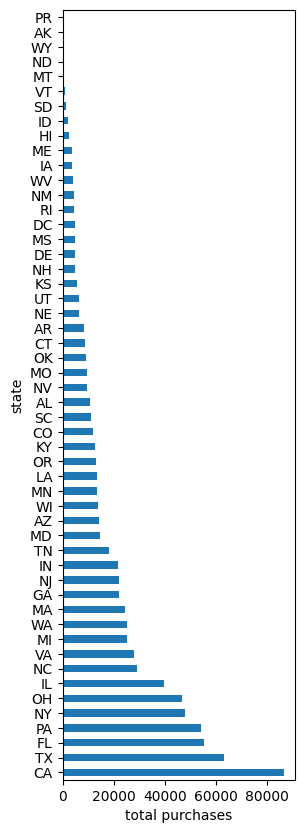

In [26]:
# Top states
total_purchases_by_state = agg_purchases_df.groupby('state')['Order Date'].count().sort_values(ascending=False)
fig, ax = plt.subplots(1,1,figsize=(3,10))
ax.set_xlabel('total purchases')
_ = total_purchases_by_state.plot.barh()

In [27]:
print('top states w.r.t. total purchases')
total_purchases_by_state.head()

top states w.r.t. total purchases


state
CA    86591
TX    63289
FL    55152
PA    54125
NY    47880
Name: Order Date, dtype: int64

top states w.r.t. $ spent


state
CA    86591
TX    63289
FL    55152
PA    54125
NY    47880
Name: Order Date, dtype: int64

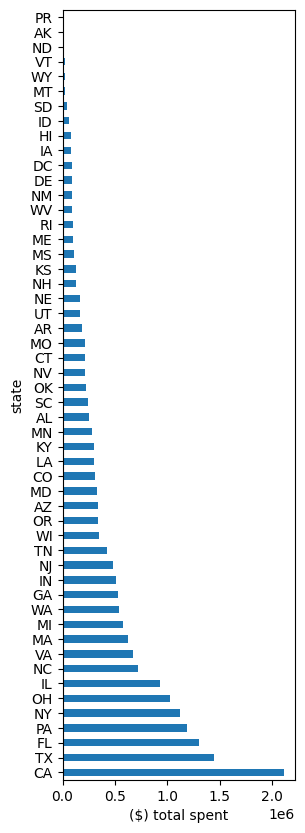

In [28]:
# spend per state

total_spend_by_state = agg_purchases_df.groupby(['state'])['total price'].sum().sort_values(ascending=False)
fig, ax = plt.subplots(1,1,figsize=(3,10))
ax.set_xlabel('($) total spent')
_ = total_spend_by_state.plot.barh()
print('top states w.r.t. $ spent')
total_purchases_by_state.head()

### Changes in purchases by state

Timelines for the biggest states:
- total purchases
- total spend


Check how these match up to other events
- COVID related data
- inflation

In [29]:
top_states = total_purchases_by_state[:5].index.to_list()
top_states

['CA', 'TX', 'FL', 'PA', 'NY']

In [101]:
yyyy_mm_list_2022_09 = yyyy_mm_list[:-3]
assert(yyyy_mm_list_2022_09[0]=='2018-01' and yyyy_mm_list_2022_09[-1]=='2022-09')
# yyyy_mm_list_2022_09

In [102]:
def get_distinct_purchasers(df, idx=yyyy_mm_list_2022_09):
    """
    Returns the number of unique responseIds making purchases
    """
    return (df.groupby(['yyyy-mm'])['Survey ResponseID'].nunique().rename('purchasers')
            .reindex(idx).fillna(0))

In [31]:
def get_median_purchase_quantity(df):
    """
    Returns the median per person monthly purchase quantity
    Note the limitation: This only counts purchases from people who made a purchase in that month
    Does not insert zeros for non purchasers
    """
    return df.groupby(
        ['yyyy-mm','Survey ResponseID']
    )['Quantity'].sum().reset_index().groupby('yyyy-mm')['Quantity'].median()

In [32]:
def get_pct_change_12mo(monthly_data):
    pct_change_12mo = 100*((monthly_data - monthly_data.shift(12))/monthly_data.shift(12)).round(3)
    return pct_change_12mo

In [33]:
def plot_quantity_purchased_by_state(df, ax, states=top_states, pct_change=False, 
                                     title='Quantity purchased by state', median=True):
    for s in states:
        s_df=df[df['state']==s]
        xmin, xmax = '2018-01', '2022-09'
        s_monthly_data = s_df.groupby(['yyyy-mm'])['Quantity'].sum()
        if median:
            s_monthly_data = get_median_purchase_quantity(s_df)
        ylabel = 'purchase quantity'
        if pct_change:
            xmin, xmax = '2019-01', '2022-09'
            s_monthly_data = get_pct_change_12mo(s_monthly_data)
            ylabel = '(%%) 12 month change in %s'%ylabel
        ax.plot(s_monthly_data, label=s)
    ax.set_xlim(xmin, xmax)
    ax.set_ylabel(ylabel)
    title = '%s (%s)' % (title, 'per person median' if median else 'total')
    ax.set_title(title)
    [tick.set_rotation(90) for tick in ax.get_xticklabels()]
    _ = ax.legend()

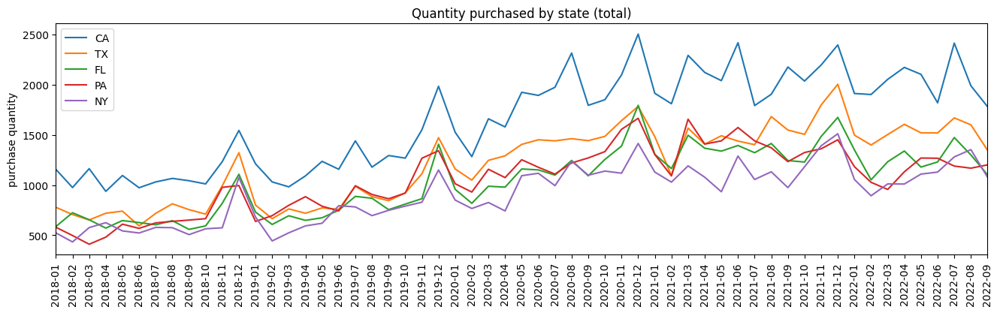

In [34]:
fig, ax = plt.subplots(1, 1, figsize=(16,4))
plot_quantity_purchased_by_state(agg_purchases_df, ax, top_states, median=False)

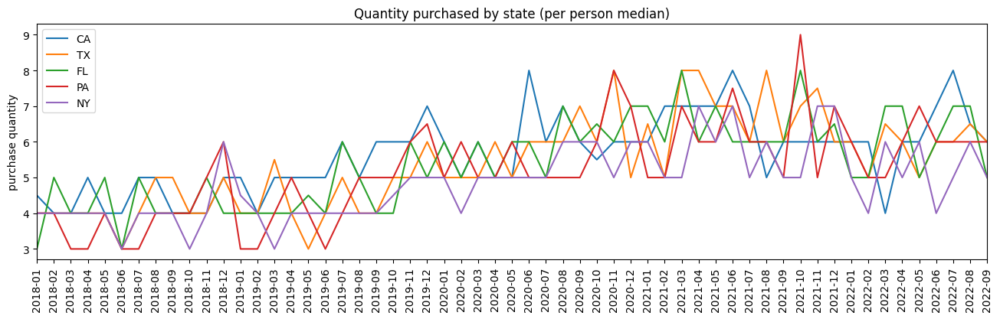

In [35]:
fig, ax = plt.subplots(1, 1, figsize=(16,4))
plot_quantity_purchased_by_state(agg_purchases_df, ax, top_states, median=True)

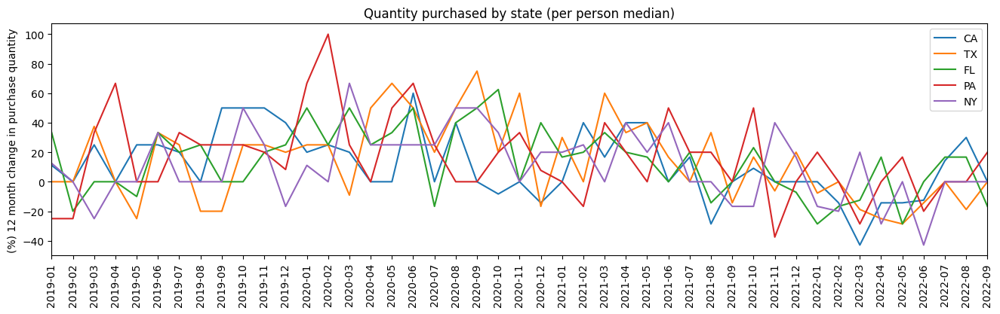

In [36]:
fig, ax = plt.subplots(1, 1, figsize=(16,4))
plot_quantity_purchased_by_state(agg_purchases_df, ax, top_states, pct_change=True)

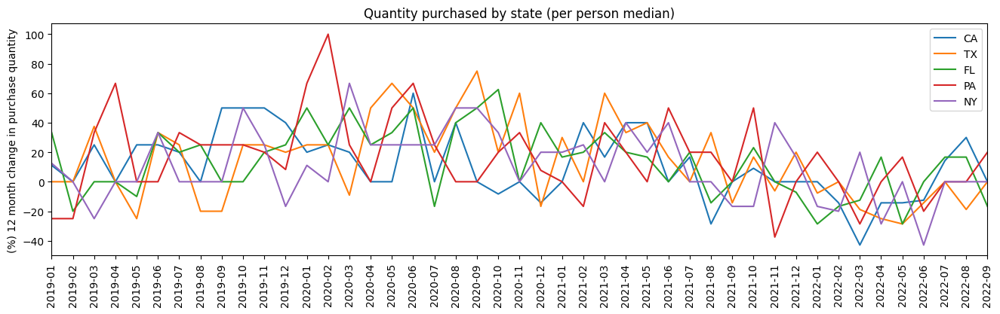

In [37]:
fig, ax = plt.subplots(1, 1, figsize=(16,4))
plot_quantity_purchased_by_state(agg_purchases_df, ax, top_states, pct_change=True, median=True)

In [38]:
def get_median_spend(df):
    """
    Returns the median per person monthly spend
    Note the limitation: This only counts purchases from people who made a purchase in that month
    Does not insert zeros for non purchasers -- inserting zeros would make all medians zeros
    """
    return df.groupby(
        ['yyyy-mm','Survey ResponseID']
    )['total price'].sum().reset_index().groupby('yyyy-mm')['total price'].median().rename('spend')

In [39]:
def plot_spend_by_state(df, ax, states=top_states, pct_change=False, title='Spend by state', median=True):
    for s in top_states:
        s_df = df[df['state']==s]
        xmin, xmax = '2018-01', '2022-09'
        s_monthly_data = s_df.groupby(['yyyy-mm'])['total price'].sum()
        if median:
            s_monthly_data = get_median_spend(s_df)
        ylabel = '($) spend'
        if pct_change:
            #xmin, xmax = '2019-01', '2022-09'
            s_monthly_data = get_pct_change_12mo(s_monthly_data)
            ylabel = '(%%) 12 month change in %s'%ylabel
        ax.plot(s_monthly_data, label=s)
    ax.set_xlim(xmin, xmax)
    ax.set_ylabel(ylabel)
    title = '%s (%s)' % (title, 'per person median' if median else 'total')
    ax.set_title(title)
    [tick.set_rotation(90) for tick in ax.get_xticklabels()]
    _ = ax.legend()

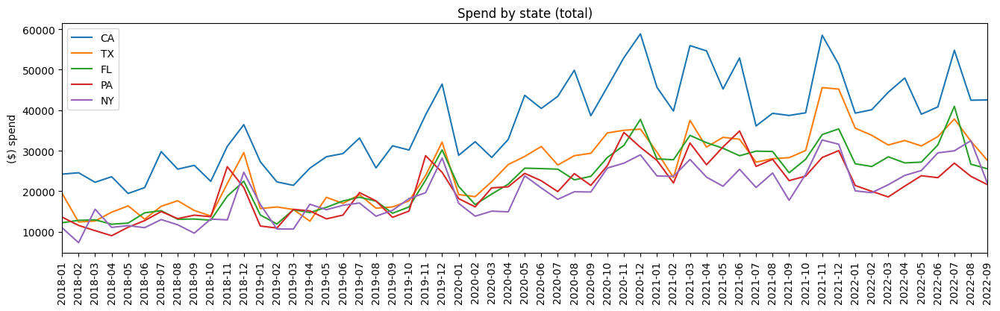

In [40]:
fig, ax = plt.subplots(1, 1, figsize=(16,4))
plot_spend_by_state(agg_purchases_df, ax, top_states, median=False)

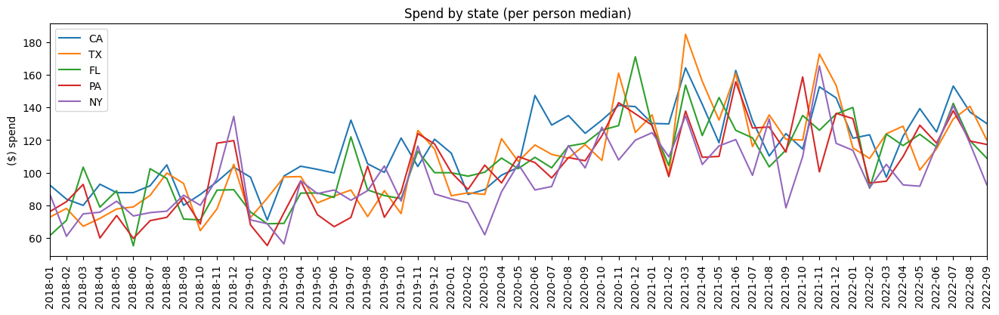

In [41]:
fig, ax = plt.subplots(1, 1, figsize=(16,4))
plot_spend_by_state(agg_purchases_df, ax, top_states, median=True)

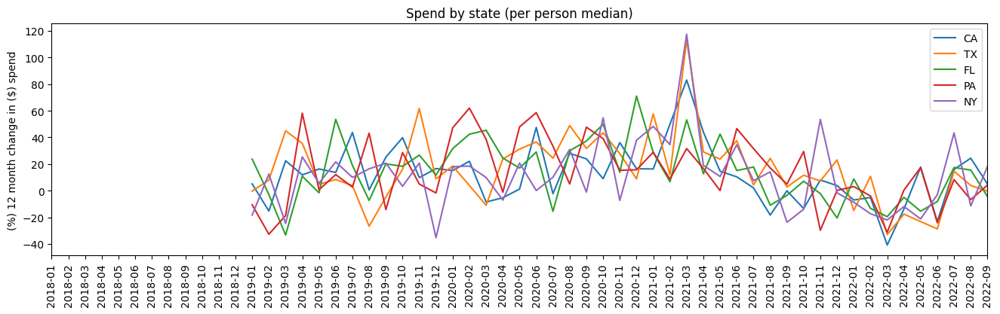

In [42]:
fig, ax = plt.subplots(1, 1, figsize=(16,4))
plot_spend_by_state(agg_purchases_df, ax, top_states, pct_change=True)

In [43]:
def plot_distinct_purchasers_by_state(df, ax, states=top_states, pct_change=False, 
                                      title='Number of people making purchases by state', scatter=True):
    for s in states:
        s_df=df[df['state']==s]
        xmin, xmax = '2018-01', '2022-09'
        s_monthly_data = get_distinct_purchasers(s_df)
        ylabel = 'response IDs'
        if pct_change:
            xmin, xmax = '2019-01', '2022-09'
            s_monthly_data = get_pct_change_12mo(s_monthly_data)
            ylabel = '(%%) 12 month change in %s'%ylabel
        if scatter:
            ax.scatter(s_monthly_data.index, s_monthly_data, label=s)
        else: 
            ax.plot(s_monthly_data, label=s)
    ax.set_xlim(xmin, xmax)
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    [tick.set_rotation(90) for tick in ax.get_xticklabels()]
    _ = ax.legend()

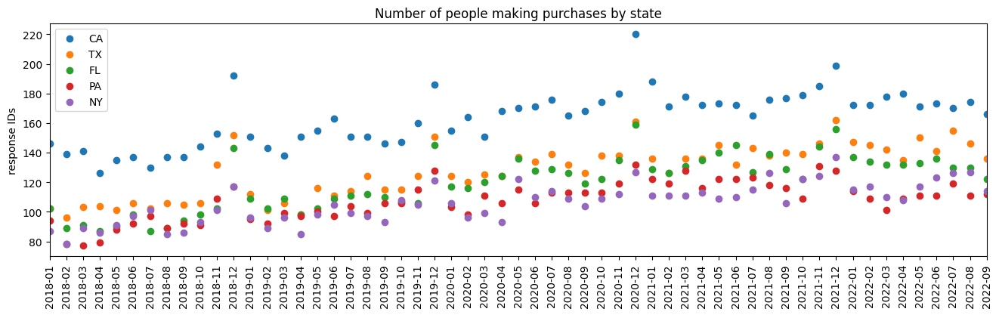

In [44]:
fig, ax = plt.subplots(1, 1, figsize=(16,4))
plot_distinct_purchasers_by_state(agg_purchases_df, ax, top_states)

In [45]:
import statsmodels.api as sm

CA
yyyy-mm
2018-01-01    146
2018-02-01    139
2018-03-01    141
2018-04-01    126
2018-05-01    135
Name: purchasers, dtype: int64


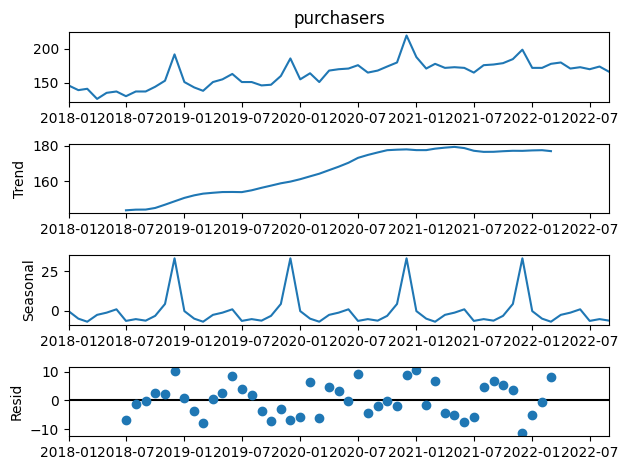

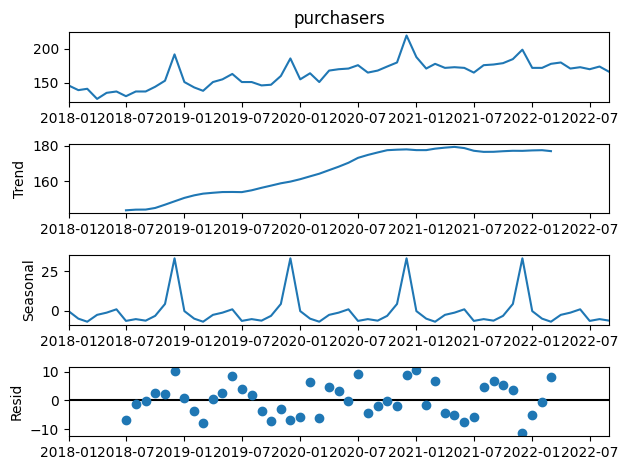

In [46]:
s = 'CA'
print(s)
ny = agg_purchases_df[agg_purchases_df['state']==s]
ny_monthly_data = get_distinct_purchasers(ny)
ny_monthly_data.index = pd.to_datetime(ny_monthly_data.index)
print(ny_monthly_data.head())

res = sm.tsa.seasonal_decompose(ny_monthly_data)
res.plot()

NY
yyyy-mm
2018-01-01    87
2018-02-01    78
2018-03-01    89
2018-04-01    86
2018-05-01    91
Name: purchasers, dtype: int64


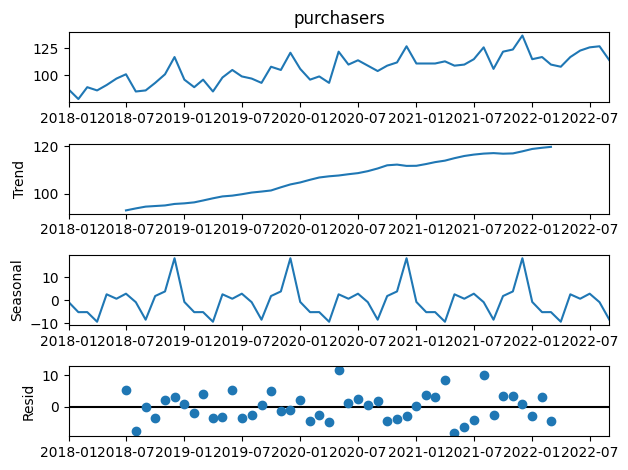

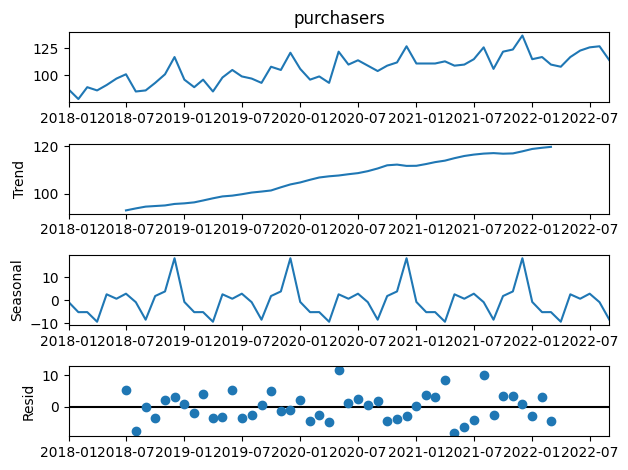

In [47]:
s = 'NY'
print(s)
ny = agg_purchases_df[agg_purchases_df['state']==s]
ny_monthly_data = get_distinct_purchasers(ny)
ny_monthly_data.index = pd.to_datetime(ny_monthly_data.index)
print(ny_monthly_data.head())

res = sm.tsa.seasonal_decompose(ny_monthly_data)
res.plot()

Look at specific categories where purchasing could be impacted by COVID

In [48]:
cat_eat = ['GROCERY', 'FOOD'] # Too noisy by itself right now
cat_eat_plus = cat_eat + [
    'SNACK_FOOD_BAR', 'NUTRITIONAL_SUPPLEMENT', 'TEA',
    'HERBAL_SUPPLEMENT', 'COFFEE', 'VITAMIN'
]
cat_cleaning = ['SKIN_CLEANING_AGENT', 'CLEANING_AGENT']
cat_medication = ['MEDICATION']
cat_health_beauty = ['SKIN_MOISTURIZER', 'BEAUTY', 'HEALTH_PERSONAL_CARE']
cat_apparel = ['SOCKS', 'SHIRT', 'PANTS', 'UNDERPANTS', 'SHOES','DRESS']

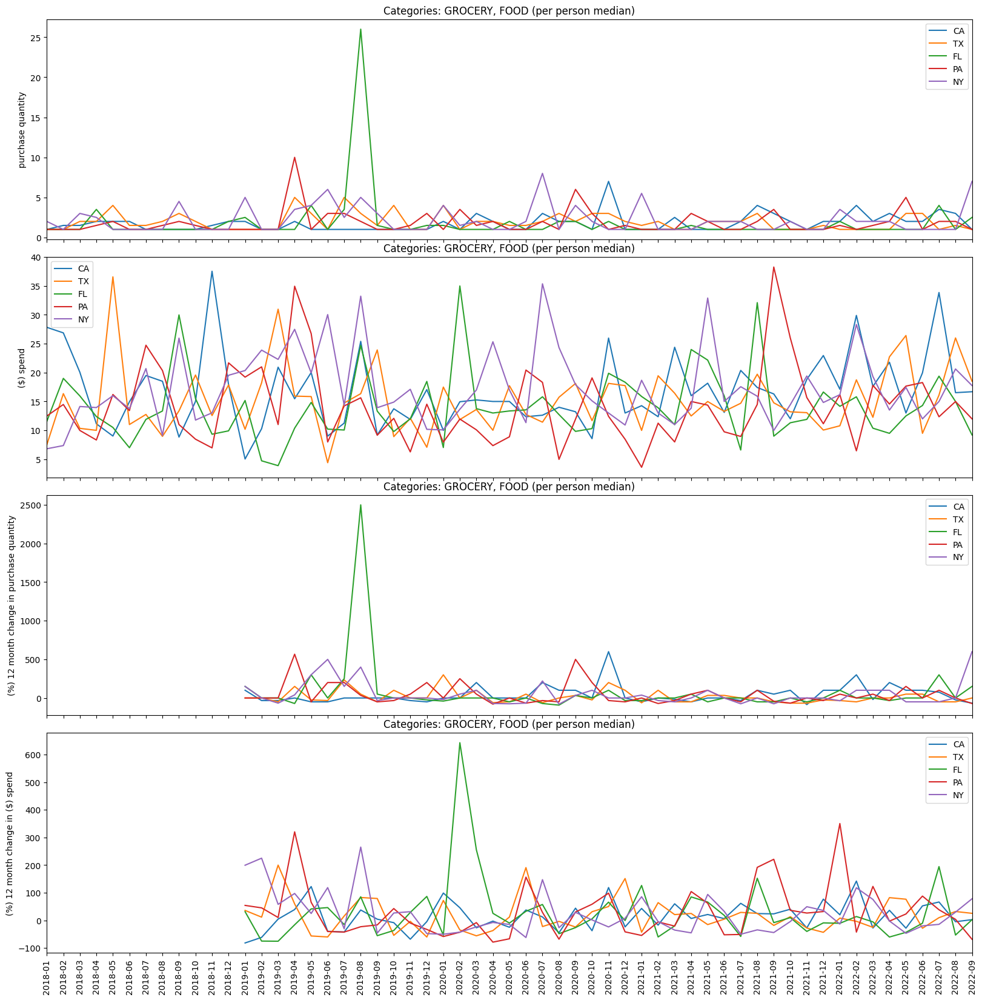

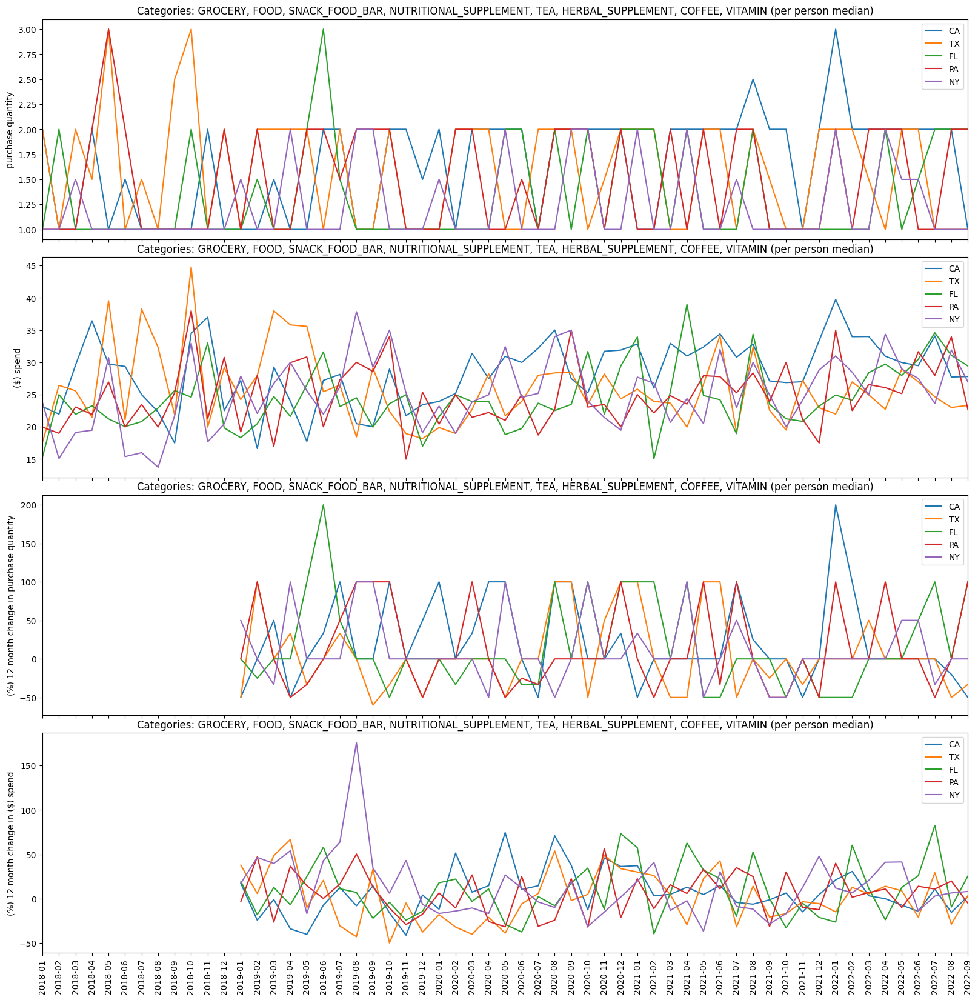

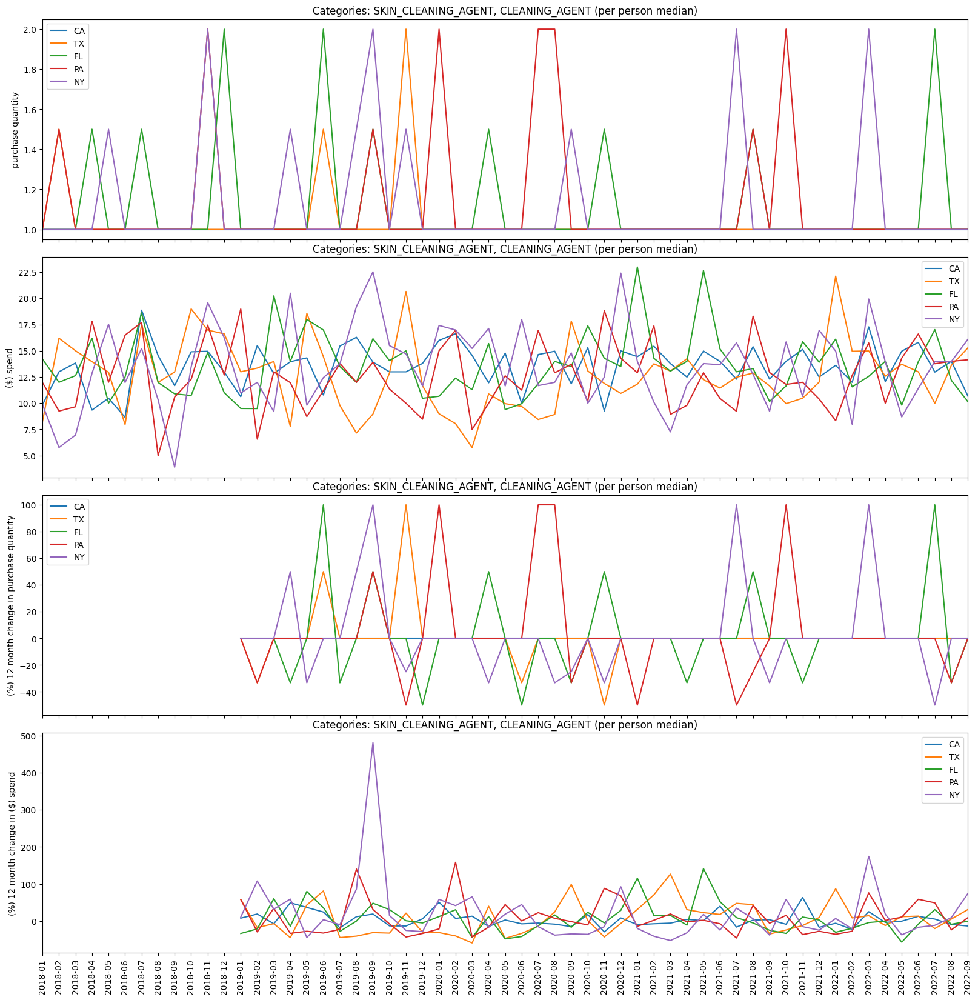

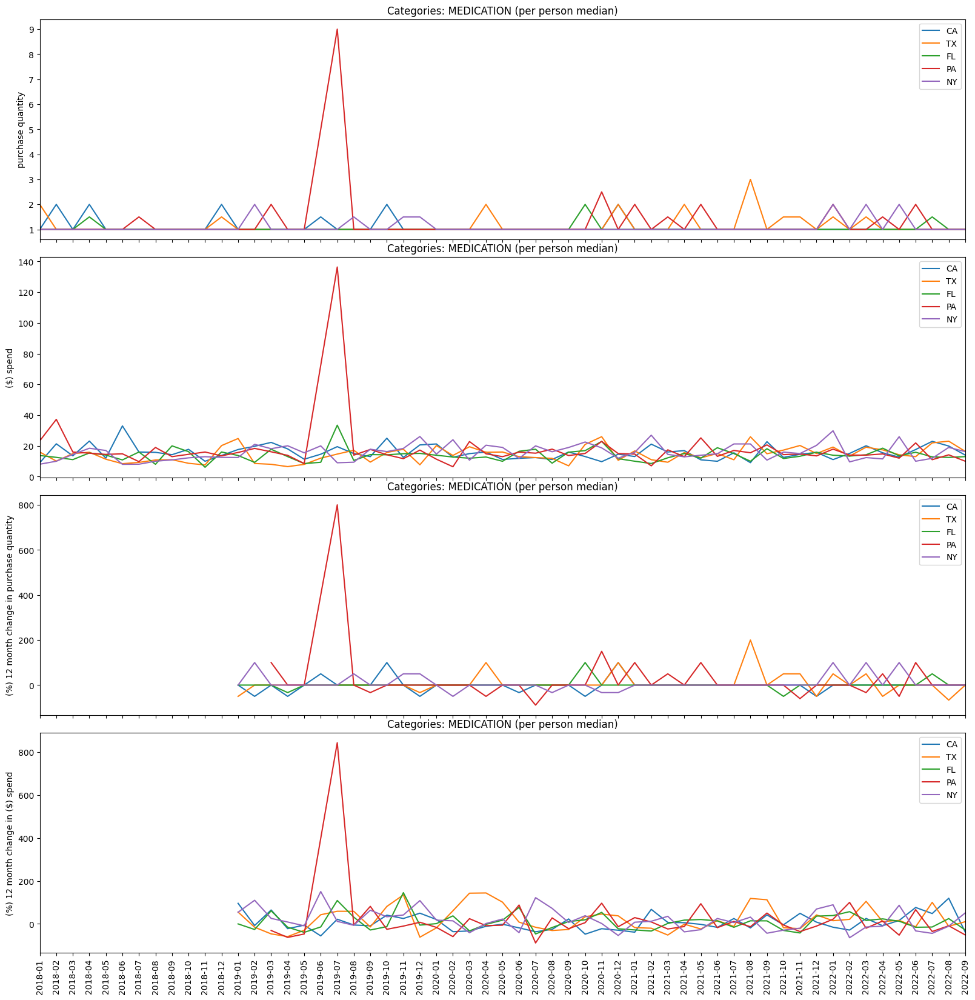

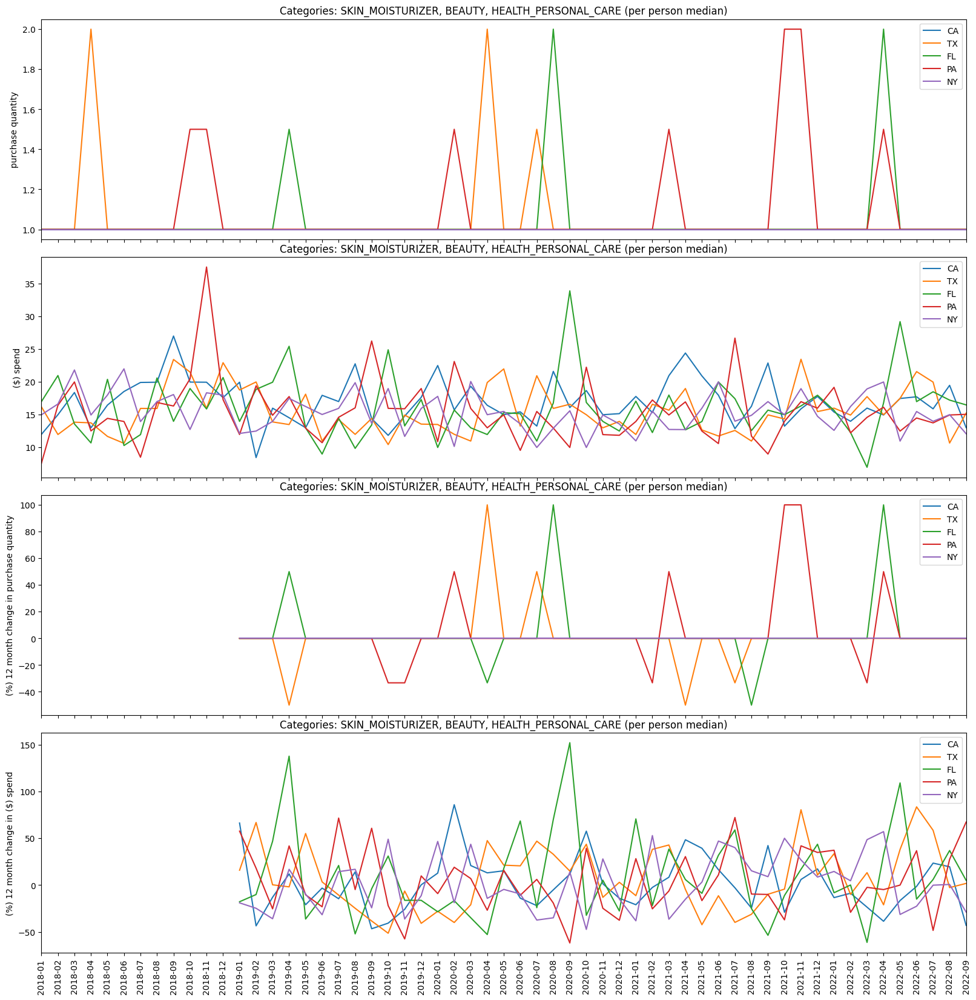

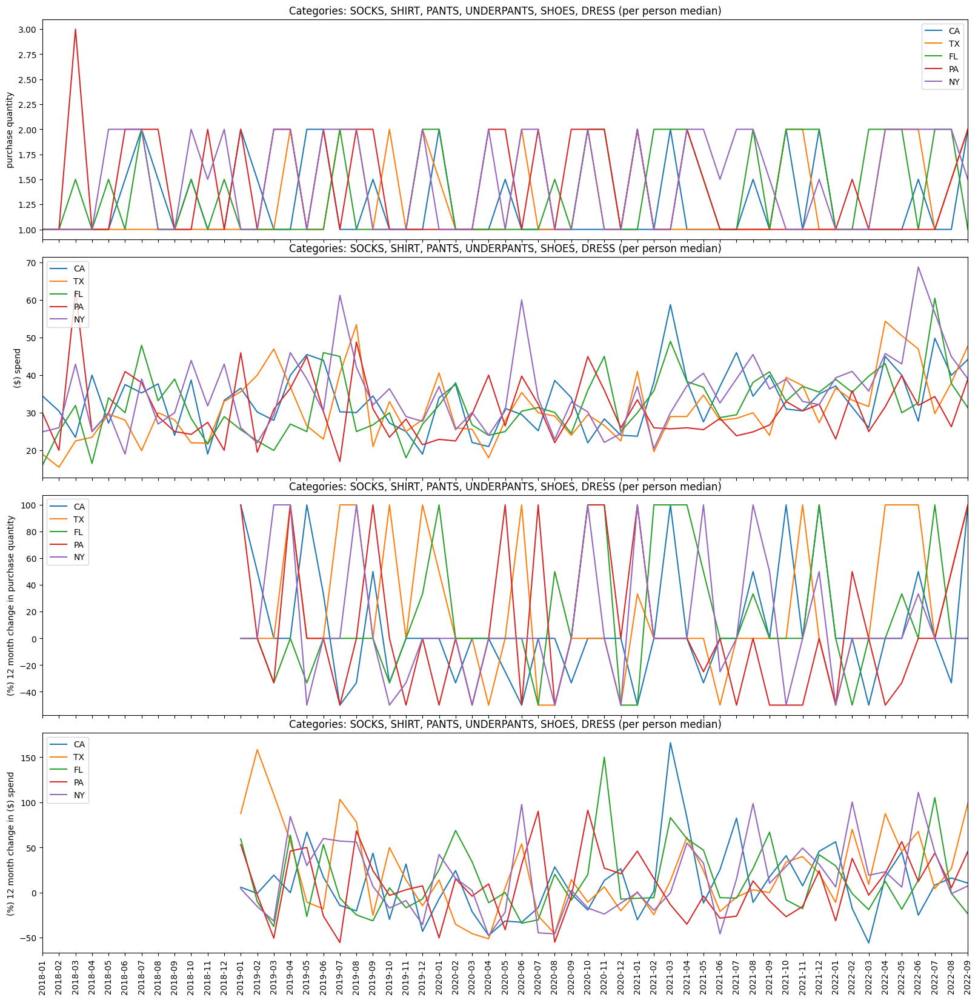

In [49]:
cats_list = [cat_eat, cat_eat_plus, cat_cleaning, cat_medication, cat_health_beauty, cat_apparel]
for i, cats in enumerate(cats_list):
    fig, axes = plt.subplots(4, 1, figsize=(16,4*4), sharex=True)
    plt.tight_layout()
    cat_agg_purchases_df = agg_purchases_df[agg_purchases_df['Category'].isin(cats)]
    title = 'Categories: '+', '.join(cats)
    plot_quantity_purchased_by_state(cat_agg_purchases_df, axes[0], top_states, title=title)
    plot_spend_by_state(cat_agg_purchases_df, axes[1], top_states, title=title)
    # plot pct change
    plot_quantity_purchased_by_state(cat_agg_purchases_df, axes[2], top_states, pct_change=True, title=title)
    plot_spend_by_state(cat_agg_purchases_df, axes[3], top_states, pct_change=True, title=title)
    plt.show()

2668 total TOILET_PAPER purchases


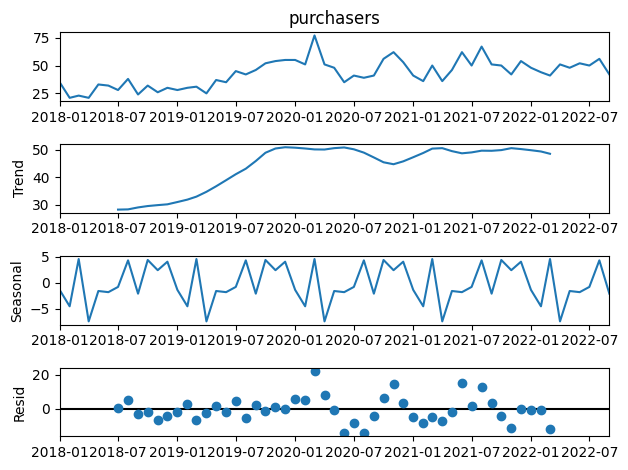

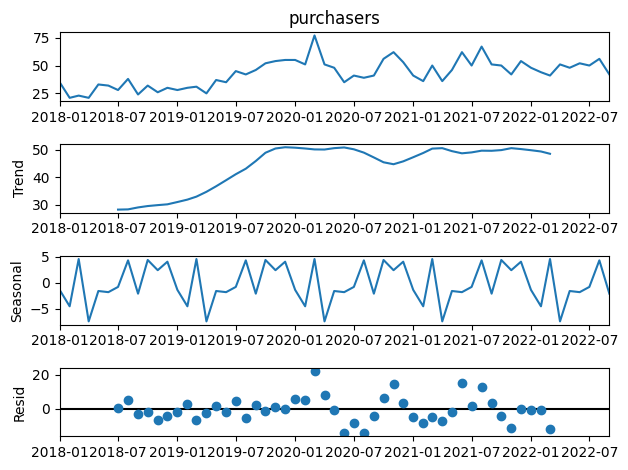

In [50]:
tp = agg_purchases_df[agg_purchases_df['Category']=='TOILET_PAPER']
print('%s total TOILET_PAPER purchases' % len(tp))
tp_monthly_purchasers = get_distinct_purchasers(tp)
tp_monthly_purchasers.index = pd.to_datetime(tp_monthly_purchasers.index)
res = sm.tsa.seasonal_decompose(tp_monthly_purchasers)
res.plot()

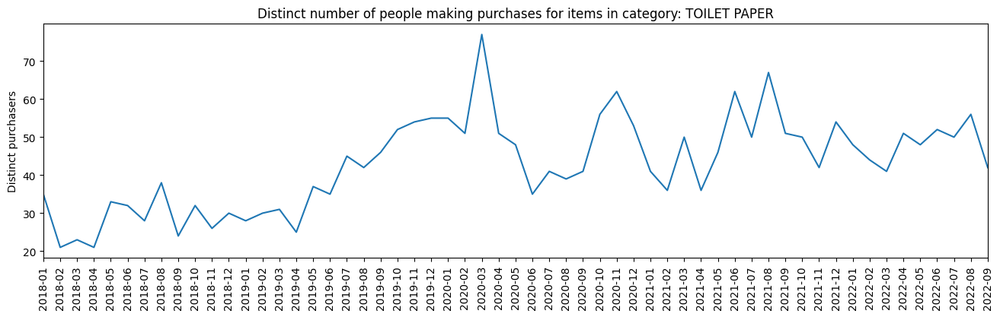

In [146]:
title = 'Distinct number of people making purchases for items in category: TOILET PAPER'
fig, ax = plt.subplots(1, 1, figsize=(16,4))
xmin, xmax = '2018-01', '2022-09'
tp_monthly_data = get_distinct_purchasers(tp)
ylabel = 'Distinct purchasers'
ax.plot(tp_monthly_data)#, label='all')
ax.set_xlim(xmin, xmax)
ax.set_ylabel(ylabel)
ax.set_title(title)
_ = [tick.set_rotation(90) for tick in ax.get_xticklabels()]
# _ = ax.legend()

How many states do we have a threshold of monthly purchases from?

In [115]:
state_monthly_purchasers = pd.DataFrame({
    'state': state_codes,
    'min montly purchasers': [get_distinct_purchasers(agg_purchases_df[agg_purchases_df['state']==s]).min() for s in state_codes]
}).set_index('state').sort_values('min montly purchasers',ascending=False)

In [116]:
print(state_monthly_purchasers.describe())
print(state_monthly_purchasers.head(10))

       min montly purchasers
count              52.000000
mean               24.038462
std                27.656834
min                 0.000000
25%                 5.000000
50%                16.500000
75%                32.250000
max               126.000000
       min montly purchasers
state                       
CA                     126.0
TX                      96.0
FL                      87.0
NY                      78.0
PA                      77.0
IL                      66.0
OH                      59.0
MA                      43.0
MI                      41.0
VA                      40.0


Can't do the same with hand sanitizer because there are not enough unique monthly purchasers

In [54]:
cat = 'HAND_SANITIZER'
t = agg_purchases_df[agg_purchases_df['Category']==cat]
print('%s total purchases' % len(t))
t_monthly_purchasers = get_distinct_purchasers(t)
print(t_monthly_purchasers.head())
t.head(3)

191 total purchases
yyyy-mm
2018-05    1
2018-07    2
2018-10    1
2018-11    1
2018-12    1
Name: purchasers, dtype: int64


,Order Date,Purchase Price Per Unit,Quantity,Shipping Address State,Title,ASIN/ISBN (Product Code),Category,Survey ResponseID,unit price,total price,yyyy-mm,state
243,2021-09-28,$15.76,1.0,NY,Purell Advanced Hand Sanitizer Naturals with P...,B01BXYP4ZW,HAND_SANITIZER,R_1Nnv2IYQFpUwHrr,15.76,15.76,2021-09,NY
863,2020-09-23,$11.70,1.0,AL,Swan 70% Rubbing Alcohol 2x32oz,B00G7ZCPPA,HAND_SANITIZER,R_1g1LuqDCZMfkMUl,11.70,11.70,2020-09,AL
39,2019-07-12,$2.95,1.0,WISCONSIN,Amazon Brand - Solimo 70% Isopropyl Alcohol Fi...,B07NFVQCJP,HAND_SANITIZER,R_3G2FrnXm2CdS0gc,2.95,2.95,2019-07,WI


In [73]:
mask_cats = [c for c in list(agg_purchases_df['Category'].unique()) if 'MASK' in str(c)]
print(mask_cats)

['SLEEP_MASK', 'SKIN_TREATMENT_MASK', 'SAFETY_MASK', 'COSTUME_MASK', 'SAFETY_MASK_STRAP_EXTENDER', 'SPORT_FACE_MASK', 'SAFETY_MASK_REPLACEMENT_FILTER', 'DIVE_MASK']


In [68]:
mask_titles = [t for t in agg_purchases_df['Title'].unique() if 'face mask' in str(t).lower()]

In [72]:
mask_orders_df = agg_purchases_df[agg_purchases_df['Title'].isin(mask_titles)]
print(len(mask_orders_df))
mask_orders_df.head(3)

3294


,Order Date,Purchase Price Per Unit,Quantity,Shipping Address State,Title,ASIN/ISBN (Product Code),Category,Survey ResponseID,unit price,total price,yyyy-mm,state
144,2020-02-03,$23.97,1.0,NY,100 Pack Disposable Face Masks with Elastic Ea...,B07QKX2PJS,SAFETY_MASK,R_1Nnv2IYQFpUwHrr,23.97,23.97,2020-02,NY
225,2021-05-24,$13.99,1.0,NY,"[Pack of 100] Blue Disposable Face Mask, Effec...",B08HMDH2YD,SAFETY_MASK,R_1Nnv2IYQFpUwHrr,13.99,13.99,2021-05,NY
416,2020-11-26,$10.85,1.0,IL,Reusable Cotton Face Mask (Pack of 50),B086WC1LDD,SAFETY_MASK,R_2f2HuzhFg7Fnduq,10.85,10.85,2020-11,IL


Relative monthly purchasers for category X is computed per month as:

(Number of distinct purchasers buying items in category X) / (Number of distinct purchasers making any purchase)

In [103]:
cat = 'SAFETY_MASK'
t = agg_purchases_df[agg_purchases_df['Category']==cat]
print('%s total purchases' % len(t))
t_monthly_purchasers = get_distinct_purchasers(t)
# get monthly purchasers for category relative to total monthly purchasers
t_monthly_purchasers_rel = t_monthly_purchasers / get_distinct_purchasers(agg_purchases_df)
print(t_monthly_purchasers.head())

2382 total purchases
yyyy-mm
2018-01    0.0
2018-02    0.0
2018-03    1.0
2018-04    1.0
2018-05    0.0
Name: purchasers, dtype: float64


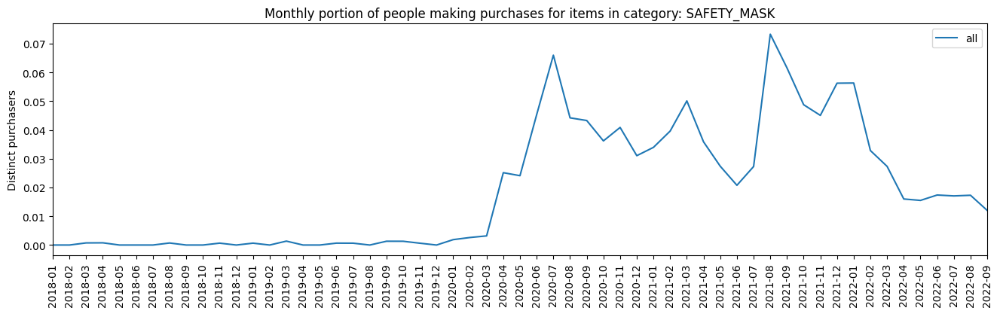

In [127]:
title = 'Monthly portion of people making purchases for items in category: %s'%cat
fig, ax = plt.subplots(1, 1, figsize=(16,4))
ylabel = 'Distinct purchasers'
ax.plot(t_monthly_purchasers_rel, label='all')
ax.set_xlim(yyyy_mm_list_2022_09[0], yyyy_mm_list_2022_09[-1])
ax.set_ylabel(ylabel)
ax.set_title(title)
[tick.set_rotation(90) for tick in ax.get_xticklabels()]
_ = ax.legend()

plots for states: ['CA', 'TX', 'FL', 'NY', 'OH', 'MA']
2382 total purchases
CA: 283 total purchases for SAFETY_MASK
TX: 171 total purchases for SAFETY_MASK
FL: 155 total purchases for SAFETY_MASK
NY: 222 total purchases for SAFETY_MASK
OH: 79 total purchases for SAFETY_MASK
MA: 85 total purchases for SAFETY_MASK


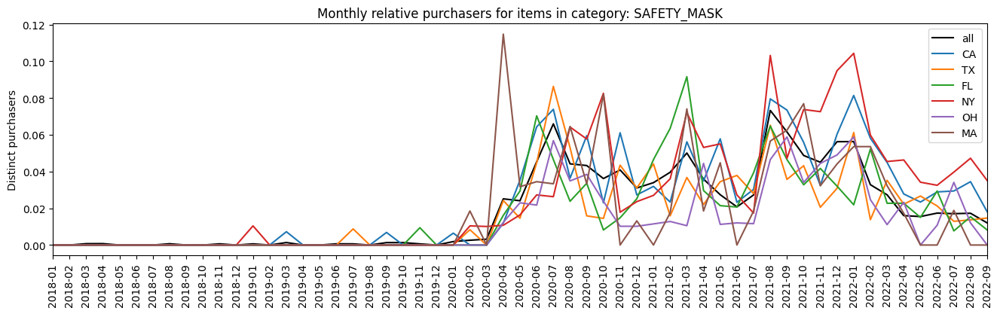

In [140]:
# plot_states = state_monthly_purchasers.head(10).index
plot_states = ['CA', 'TX', 'FL', 'NY', 'OH', 'MA']
print('plots for states:',list(plot_states))

cat = 'SAFETY_MASK'
title = 'Monthly relative purchasers for items in category: %s'%cat
fig, ax = plt.subplots(1, 1, figsize=(16,4))
t = agg_purchases_df[agg_purchases_df['Category']==cat]
print('%s total purchases' % len(t))
t_monthly_purchasers = get_distinct_purchasers(t)
# get monthly purchasers for category relative to total monthly purchasers
t_monthly_purchasers_rel = t_monthly_purchasers / get_distinct_purchasers(agg_purchases_df)

ax.plot(t_monthly_purchasers_rel, label='all', color='black')
for s in plot_states:
    s_df = agg_purchases_df[agg_purchases_df['state']==s]
    t = s_df[s_df['Category']==cat]
    print('%s: %s total purchases for %s' % (s, len(t), cat))
    t_monthly_purchasers = get_distinct_purchasers(t)
    t_monthly_purchasers_rel = t_monthly_purchasers / get_distinct_purchasers(s_df)
    ax.plot(t_monthly_purchasers_rel, label=s)
    
ylabel = 'Distinct purchasers'
ax.set_xlim(t_monthly_purchasers_rel.index[0], t_monthly_purchasers_rel.index[-1])
ax.set_ylabel(ylabel)
ax.set_title(title)
[tick.set_rotation(90) for tick in ax.get_xticklabels()]
_ = ax.legend()

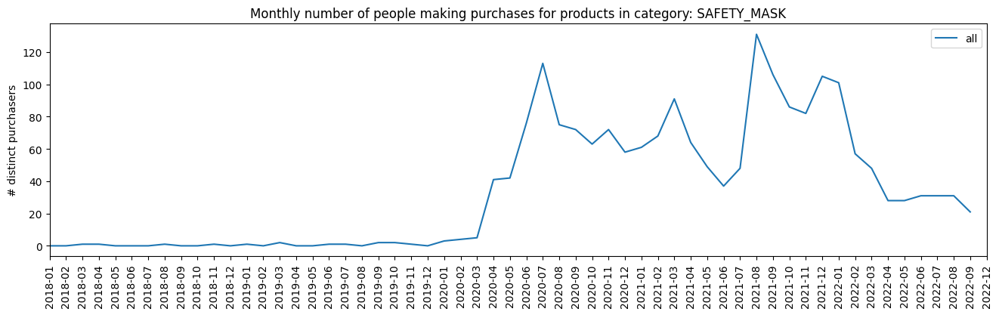

In [128]:
title = 'Monthly number of people making purchases for products in category: %s'%cat
fig, ax = plt.subplots(1, 1, figsize=(16,4))
ylabel = '# distinct purchasers'
ax.plot(t_monthly_purchasers, label='all')
ax.set_xlim(yyyy_mm_list[0], yyyy_mm_list[-1])
ax.set_ylabel(ylabel)
ax.set_title(title)
[tick.set_rotation(90) for tick in ax.get_xticklabels()]
_ = ax.legend()

42415 total purchases
yyyy-mm
2018-01    407
2018-02    279
2018-03    304
2018-04    287
2018-05    313
Name: purchasers, dtype: int64


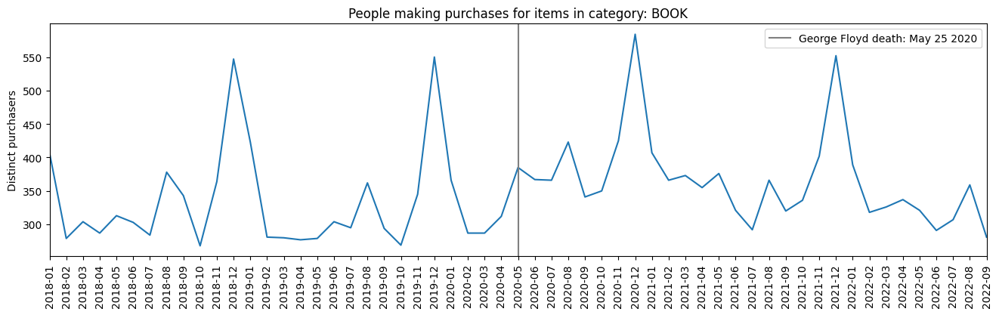

In [163]:
cat = 'ABIS_BOOK'
t = agg_purchases_df[agg_purchases_df['Category']==cat]
print('%s total purchases' % len(t))
t_monthly_purchasers = get_distinct_purchasers(t)
print(t_monthly_purchasers.head())

title = 'People making purchases for items in category: BOOK'
fig, ax = plt.subplots(1, 1, figsize=(16,4))
xmin, xmax = '2018-01', '2022-09'
c_monthly_data = get_distinct_purchasers(t)
ylabel = 'Distinct purchasers'
ax.plot(c_monthly_data)#, label='all')
ax.set_xlim(xmin, xmax)
ax.set_ylabel(ylabel)
ax.set_title(title)
[tick.set_rotation(90) for tick in ax.get_xticklabels()]
ax.axvline('2020-05', color='gray', label='George Floyd death: May 25 2020')
_ = ax.legend()

plots for states: ['TX', 'FL', 'NY', 'MA']
42415 total purchases
TX: 3158 total purchases for ABIS_BOOK
FL: 2327 total purchases for ABIS_BOOK
NY: 2437 total purchases for ABIS_BOOK
MA: 1365 total purchases for ABIS_BOOK


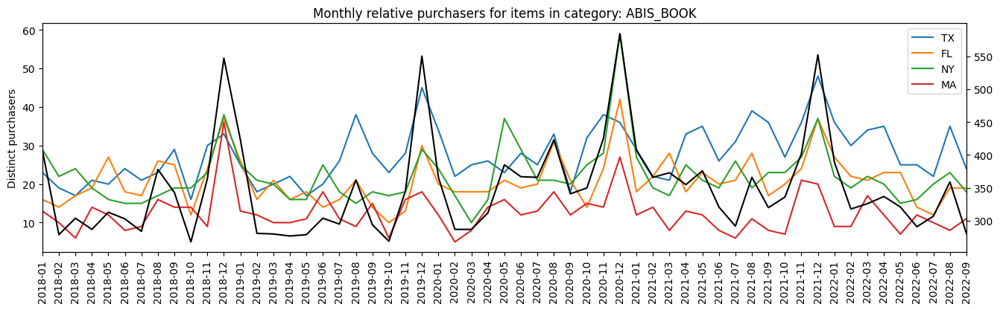

In [161]:
# plot_states = state_monthly_purchasers.head(10).index
plot_states = ['TX', 'FL', 'NY', 'MA']
print('plots for states:',list(plot_states))

cat = 'ABIS_BOOK'
title = 'Monthly relative purchasers for items in category: %s'%cat
fig, ax = plt.subplots(1, 1, figsize=(16,4))
ax2 = ax.twinx()
t = agg_purchases_df[agg_purchases_df['Category']==cat]
print('%s total purchases' % len(t))
t_monthly_purchasers = get_distinct_purchasers(t)
# get monthly purchasers for category relative to total monthly purchasers
t_monthly_purchasers_rel = t_monthly_purchasers / get_distinct_purchasers(agg_purchases_df)

ax2.plot(t_monthly_purchasers, label='all', color='black')
for s in plot_states:
    s_df = agg_purchases_df[agg_purchases_df['state']==s]
    t = s_df[s_df['Category']==cat]
    print('%s: %s total purchases for %s' % (s, len(t), cat))
    t_monthly_purchasers = get_distinct_purchasers(t)
    #t_monthly_purchasers_rel = t_monthly_purchasers / get_distinct_purchasers(s_df)
    ax.plot(t_monthly_purchasers, label=s)
    
ylabel = 'Distinct purchasers'
ax.set_xlim(t_monthly_purchasers_rel.index[0], t_monthly_purchasers_rel.index[-1])
ax.set_ylabel(ylabel)
ax.set_title(title)
[tick.set_rotation(90) for tick in ax.get_xticklabels()]
_ = ax.legend()

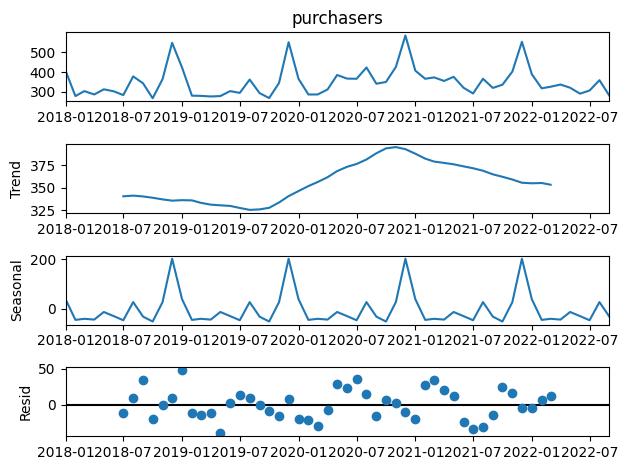

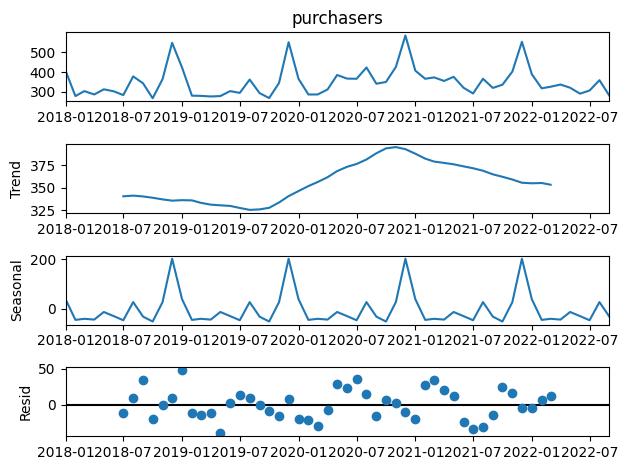

In [149]:
t_monthly_purchasers.index = pd.to_datetime(t_monthly_purchasers.index)
res = sm.tsa.seasonal_decompose(t_monthly_purchasers)
res.plot()

In [60]:
agg_purchases_df.head()

,Order Date,Purchase Price Per Unit,Quantity,Shipping Address State,Title,ASIN/ISBN (Product Code),Category,Survey ResponseID,unit price,total price,yyyy-mm,state
0,2018-02-21,$7.93,1.0,RHODE ISLAND,Suburban World: The Norling Photos,0873516095,ABIS_BOOK,R_3I9Pu8iauEcOx9A,7.93,7.93,2018-02,RI
1,2018-02-21,$3.53,1.0,RHODE ISLAND,NaN,B004S7EZR0,NaN,R_3I9Pu8iauEcOx9A,3.53,3.53,2018-02,RI
2,2018-03-05,$5.99,1.0,RHODE ISLAND,1952 Back In The Day - 24-page Greeting Card /...,193938012X,ABIS_BOOK,R_3I9Pu8iauEcOx9A,5.99,5.99,2018-03,RI
3,2018-04-04,$23.85,1.0,RHODE ISLAND,Adeco Decorative Wood Wall Hanging Picture Fra...,B00DGYHIMU,PICTURE_FRAME,R_3I9Pu8iauEcOx9A,23.85,23.85,2018-04,RI
4,2018-04-29,$4.50,1.0,RHODE ISLAND,Time of Wonder (Picture Puffins),0140502017,ABIS_BOOK,R_3I9Pu8iauEcOx9A,4.50,4.50,2018-04,RI


### TODO: dig into this data more

TODO

- more anomoly detection

## Inflation indicators

Analysis methods

Idea:
- restrict analysis to products/titles that have enough data: at least X purchases for each month
    - yyyy-mm range: 2018-01 to 2022-10
    - restrict analysis to products/titles with at least Y months of such data
    - TODO: want X months to be at least 3 -- currently using 1
    - TODO: want Y months to be larger -- currently using Y = 24? 36?
- for each such product: collect median price for each yyyy-mm
- to create median price timeseries for each such product: yyyy-mm: median price
- transform to inflation time series: 
    - compute inflation time series as change in median price from 12 months prior: 100*(median price - median price[yyyy-mm - 12 months])/median price[yyyy-mm - 12 months]
- collect these timeseries by category
- for each category, compute median and 10/90th monthly inflation percentiles across all products in category



How many items had at least 3 purchases for all months in our dataset?

group by product code + title to handle product codes with multiple sizes (shown in titles)

- TODO: need more data before can properly restrict data to items with at least 3 purchases per month.

In [756]:
pmo = (
    agg_purchases_df.groupby(
        ['ASIN/ISBN (Product Code)', 'Title', 'yyyy-mm']
    ).agg({'Order Date': 'nunique', 'unit price': 'median'})
    .rename(columns={'Order Date':'count','unit price':'median price'})
    .reset_index().sort_values(['yyyy-mm','count'], ascending=False)
)
pmo.head()

,ASIN/ISBN (Product Code),Title,yyyy-mm,count,median price
541617,B07QBQLDWJ,Old Wisconsin Honey Brown Sugar Turkey Sausage...,2022-09,9,14.980
131468,B0051U7W32,"Mack's Ultra Soft Foam Earplugs, 50 Pair - 33d...",2022-09,8,8.990
210212,B00MNV8E0C,Amazon Basics 48 Pack AA High-Performance Alka...,2022-09,8,13.830
601575,B07ZLFPXHC,"Dole Bananas, 2 lb Bag",2022-09,8,1.290
206119,B00LH3DMUO,Amazon Basics 36 Pack AAA High-Performance Alk...,2022-09,6,9.115


In [969]:
# restrict to rows where count of product + month is >= 3
pmo3 = pmo[pmo['count']>=3]
pmo2 = pmo[pmo['count']>=2]
print(pmo.describe())
pmo.head()

               count   median price
count  738760.000000  738760.000000
mean        1.079218      22.388773
std         0.367251      46.136090
min         1.000000       0.010000
25%         1.000000       8.590000
50%         1.000000      13.990000
75%         1.000000      22.990000
max        20.000000    6398.950000


,ASIN/ISBN (Product Code),Title,yyyy-mm,count,median price
541617,B07QBQLDWJ,Old Wisconsin Honey Brown Sugar Turkey Sausage...,2022-09,9,14.980
131468,B0051U7W32,"Mack's Ultra Soft Foam Earplugs, 50 Pair - 33d...",2022-09,8,8.990
210212,B00MNV8E0C,Amazon Basics 48 Pack AA High-Performance Alka...,2022-09,8,13.830
601575,B07ZLFPXHC,"Dole Bananas, 2 lb Bag",2022-09,8,1.290
206119,B00LH3DMUO,Amazon Basics 36 Pack AAA High-Performance Alk...,2022-09,6,9.115


Note there are not sufficient products with orders in every month.

In [758]:
# restrict to products with sufficient data for all months
(pmo.groupby(['ASIN/ISBN (Product Code)'])['yyyy-mm'].nunique() == agg_purchases_df['yyyy-mm'].nunique()).sum()

1

In [968]:
print(pmo3.describe())
pmo3.head()

             count  median price
count  8872.000000   8872.000000
mean      3.546664     16.406332
std       1.103722     28.493680
min       3.000000      0.120000
25%       3.000000      4.990000
50%       3.000000      9.990000
75%       4.000000     18.971250
max      20.000000    699.000000


,ASIN/ISBN (Product Code),Title,yyyy-mm,count,median price
541617,B07QBQLDWJ,Old Wisconsin Honey Brown Sugar Turkey Sausage...,2022-09,9,14.980
131468,B0051U7W32,"Mack's Ultra Soft Foam Earplugs, 50 Pair - 33d...",2022-09,8,8.990
210212,B00MNV8E0C,Amazon Basics 48 Pack AA High-Performance Alka...,2022-09,8,13.830
601575,B07ZLFPXHC,"Dole Bananas, 2 lb Bag",2022-09,8,1.290
206119,B00LH3DMUO,Amazon Basics 36 Pack AAA High-Performance Alk...,2022-09,6,9.115


In [836]:
(pmo3.groupby(['ASIN/ISBN (Product Code)', 'Title'])['yyyy-mm'].nunique() >= 24).sum()

13

In [826]:
(pmo3.groupby(['ASIN/ISBN (Product Code)', 'Title'])['yyyy-mm'].nunique() >= 36).sum()

4

In [970]:
(pmo2.groupby(['ASIN/ISBN (Product Code)', 'Title'])['yyyy-mm'].nunique() >= 36).sum()

10

In [761]:
(pmo.groupby(['ASIN/ISBN (Product Code)', 'Title'])['yyyy-mm'].nunique() > 24).sum()

561

In [837]:
(pmo.groupby(['ASIN/ISBN (Product Code)', 'Title'])['yyyy-mm'].nunique() >= 36).sum()

143

In [1019]:
# which to use?
use_pmo = pmo2

In [1020]:
product_months_counts_df = (use_pmo.groupby(['ASIN/ISBN (Product Code)', 'Title'])['yyyy-mm']
 .nunique().to_frame().reset_index()
 .sort_values('yyyy-mm', ascending=False)
)
product_months_counts_df.head()

,ASIN/ISBN (Product Code),Title,yyyy-mm
7213,B00MNV8E0C,Amazon Basics 48 Pack AA High-Performance Alka...,53
1386,B0009X29WK,Dr. Elsey's Premium Clumping Cat Litter Ultra ...,52
7055,B00LH3DMUO,Amazon Basics 36 Pack AAA High-Performance Alk...,47
3980,B004CQWWKY,"FIJI Natural Artesian Water, 16.9 Fl Oz (Pack ...",47
12780,B074CRK54X,Amazon Brand - Presto! 308-Sheet Mega Roll Toi...,46


- Get the products where unique yyyy-mm > 36 (i.e. at least 36 months of purchases)
    - (Product code, Title) tuple pairs
- Make a dictionary med_prices_dict mapping {(Product code, Title): med_prices}
    - where med_price_series is df with columns (product code, title, yyyy-mm, median price)
    - and yyyy-mm is consistent series: 2018-01 to 2022-09

In [1021]:
# Get the products where unique yyyy-mm > X (i.e. at least 36 months of purchases)
req_months = 24
product_months_counts = use_pmo.groupby(['ASIN/ISBN (Product Code)', 'Title'])['yyyy-mm'].nunique()
product_codes_titles = product_months_counts[product_months_counts>=req_months].index.to_list()
print('%s products' % len(product_codes_titles))
# show what this loois like
print('looks like this:')
product_codes_titles[:4]

57 products
looks like this:


[('B0009X29WK',
  "Dr. Elsey's Premium Clumping Cat Litter Ultra Uncented | 99.9% Dust-Free, Low Tracking, Hard Clumping, Superior Odor Control & Natural Ingredients, 40 Pound (Pack of 1)"),
 ('B000BD0RT0',
  "Doctor's Best High Absorption Magnesium Glycinate Lysinate, 100% Chelated, Non-GMO, Vegan, Gluten & Soy Free, 100 mg, 240 Count"),
 ('B000J07BRQ',
  'Scotch Heavy Duty Packaging Tape, 1.88" x 22.2 yd, Designed for Packing, Shipping and Mailing, Strong Seal on All Box Types, 1.5" Core, Clear, 6 Rolls with Dispenser (142-6)'),
 ('B000P6J0SM', 'Strawberries, 1 lb')]

In [1022]:
# - Make a dictionary prices_dict mapping {(Product code, Title): prices}
#     - where prices is df with columns (product code, title, yyyy-mm, median price, 12 mo inflation)
#     - and yyyy-mm is consistent series: 2018-01 to 2022-09

In [1024]:
use_pmo.set_index(['ASIN/ISBN (Product Code)', 'Title']).head(3)

,,yyyy-mm,count,median price
ASIN/ISBN (Product Code),Title,,,
B07QBQLDWJ,"Old Wisconsin Honey Brown Sugar Turkey Sausage Snack Sticks, Naturally Smoked, Ready to Eat, High Protein, Low Carb, Keto, Gluten Free, 28 Ounce Resealable Package",2022-09,9,14.98
B0051U7W32,"Mack's Ultra Soft Foam Earplugs, 50 Pair - 33dB Highest NRR, Comfortable Ear Plugs for Sleeping, Snoring, Travel, Concerts, Studying, Loud Noise, Work",2022-09,8,8.99
B00MNV8E0C,"Amazon Basics 48 Pack AA High-Performance Alkaline Batteries, 10-Year Shelf Life, Easy to Open Value Pack",2022-09,8,13.83


In [1025]:
prices_dict = dict()
for i, product_code_title in enumerate(product_codes_titles):
    if i % 10 == 0:
        print(i)
    p = (use_pmo.set_index(['ASIN/ISBN (Product Code)', 'Title']).loc[product_code_title]
              .reset_index()[['yyyy-mm','count','median price']]
              .set_index('yyyy-mm').reindex(yyyy_mm_list_2022_09))
    p['12 mo inflation'] = ((p['median price'] - p.shift(12)['median price'])/p.shift(12)['median price']).round(3)
    prices_dict[product_code_title] = p

0


/Users/aberke/projects/amazon-study/data-analysis/venv-amazon-study/lib/python3.7/site-packages/ipykernel_launcher.py:5: PerformanceWarning: indexing past lexsort depth may impact performance.
  """


10
20
30
40
50


In [1026]:
list(prices_dict.keys())[:3]

[('B0009X29WK',
  "Dr. Elsey's Premium Clumping Cat Litter Ultra Uncented | 99.9% Dust-Free, Low Tracking, Hard Clumping, Superior Odor Control & Natural Ingredients, 40 Pound (Pack of 1)"),
 ('B000BD0RT0',
  "Doctor's Best High Absorption Magnesium Glycinate Lysinate, 100% Chelated, Non-GMO, Vegan, Gluten & Soy Free, 100 mg, 240 Count"),
 ('B000J07BRQ',
  'Scotch Heavy Duty Packaging Tape, 1.88" x 22.2 yd, Designed for Packing, Shipping and Mailing, Strong Seal on All Box Types, 1.5" Core, Clear, 6 Rolls with Dispenser (142-6)')]

In [1027]:
k = list(prices_dict.keys())[0]
print('for ', k)
prices = prices_dict[k]
prices.head()

for  ('B0009X29WK', "Dr. Elsey's Premium Clumping Cat Litter Ultra Uncented | 99.9% Dust-Free, Low Tracking, Hard Clumping, Superior Odor Control & Natural Ingredients, 40 Pound (Pack of 1)")


,count,median price,12 mo inflation
yyyy-mm,,,
2018-01,2.0,17.49,NaN
2018-02,NaN,NaN,NaN
2018-03,3.0,17.49,NaN
2018-04,2.0,17.49,NaN
2018-05,4.0,19.22,NaN


Plot the inflation

- group by categories

In [1028]:
# get the categories for the product codes. Map map: {product code: category}

In [1029]:
# In the case that there are multiple categories for a product code, keep just the one that appears most often
product_cat_mapping = (agg_purchases_df.groupby(['ASIN/ISBN (Product Code)', 'Category'])['Order Date']
 .count().sort_values(ascending=False).to_frame()
 .reset_index().drop_duplicates('ASIN/ISBN (Product Code)', keep='first'))
# restrict to just the products in our product_codes_titles
p_codes = [p for (p, t) in product_codes_titles]
product_cat_mapping = product_cat_mapping[product_cat_mapping['ASIN/ISBN (Product Code)'].isin(p_codes)]
print('%s product - category mappings' % len(product_cat_mapping))
# want this as a series
product_cat_mapping = product_cat_mapping.set_index('ASIN/ISBN (Product Code)')['Category']
product_cat_mapping.head()

56 product - category mappings


ASIN/ISBN (Product Code)
B074CRK54X        TOILET_PAPER
B00MNV8E0C             BATTERY
B0009X29WK        PET_SUPPLIES
B00LH3DMUO             BATTERY
B079QHML21    DIGITAL_DEVICE_4
Name: Category, dtype: object

How many distinct categories and what are they?

In [1030]:
print('%s categories' % product_cat_mapping.nunique())
print('distribution of how often they occur in our list:')
print(product_cat_mapping.value_counts().describe())
print(product_cat_mapping.value_counts().to_dict())
print('\ntop categories in our list:')
product_cat_mapping.value_counts().head(10)

38 categories
distribution of how often they occur in our list:
count    38.000000
mean      1.473684
std       0.951154
min       1.000000
25%       1.000000
50%       1.000000
75%       1.750000
max       5.000000
Name: Category, dtype: float64
{'BATTERY': 5, 'TOILET_PAPER': 4, 'HEADPHONES': 3, 'PET_FOOD': 3, 'SURFACE_CLEANING_WIPE': 3, 'DISHWASHER_DETERGENT': 2, 'HEALTH_PERSONAL_CARE': 2, 'VEGETABLE': 2, 'WASTE_BAG': 2, 'FRUIT': 2, 'WIRELESS_ACCESSORY': 1, 'DENTAL_FLOSS': 1, 'MASCARA': 1, 'COFFEE': 1, 'SNACK_FOOD_BAR': 1, 'SKIN_CLEANING_AGENT': 1, 'BREAD': 1, 'FABRIC_SOFTENER': 1, 'DRINK_FLAVORED': 1, 'ADHESIVE_TAPES': 1, 'SKIN_MOISTURIZER': 1, 'FRUIT_SNACK': 1, 'MEDICATION': 1, 'GROCERY': 1, 'SKIN_TREATMENT_MASK': 1, 'CLEANING_AGENT': 1, 'MINERAL_SUPPLEMENT': 1, 'JERKY': 1, 'ELECTRONIC_ADAPTER': 1, 'MANUAL_SHAVING_RAZOR': 1, 'FACIAL_TISSUE': 1, 'WATER': 1, 'PAPER_TOWEL': 1, 'NUTRITIONAL_SUPPLEMENT': 1, 'DIGITAL_DEVICE_3': 1, 'DIGITAL_DEVICE_4': 1, 'PET_SUPPLIES': 1, 'SKIN_CLEANING_

BATTERY                  5
TOILET_PAPER             4
HEADPHONES               3
PET_FOOD                 3
SURFACE_CLEANING_WIPE    3
DISHWASHER_DETERGENT     2
HEALTH_PERSONAL_CARE     2
VEGETABLE                2
WASTE_BAG                2
FRUIT                    2
Name: Category, dtype: int64

Just use the top categories

In [1031]:
top_cats = product_cat_mapping.value_counts().head(10).index.to_list()
top_cats

['BATTERY',
 'TOILET_PAPER',
 'HEADPHONES',
 'PET_FOOD',
 'SURFACE_CLEANING_WIPE',
 'DISHWASHER_DETERGENT',
 'HEALTH_PERSONAL_CARE',
 'VEGETABLE',
 'WASTE_BAG',
 'FRUIT']

In [1032]:
product_cat_mapping.head()

ASIN/ISBN (Product Code)
B074CRK54X        TOILET_PAPER
B00MNV8E0C             BATTERY
B0009X29WK        PET_SUPPLIES
B00LH3DMUO             BATTERY
B079QHML21    DIGITAL_DEVICE_4
Name: Category, dtype: object

category: BATTERY
category: TOILET_PAPER
category: HEADPHONES
category: PET_FOOD
category: SURFACE_CLEANING_WIPE
category: DISHWASHER_DETERGENT
category: HEALTH_PERSONAL_CARE
category: VEGETABLE
category: WASTE_BAG
category: FRUIT


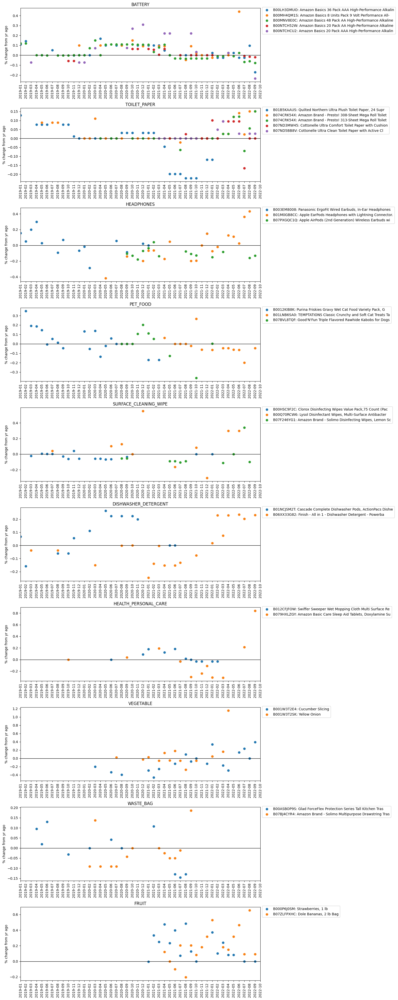

In [1033]:
fig, axes = plt.subplots(len(top_cats), 1, figsize=(16,4*len(top_cats)))
for i, cat in enumerate(top_cats):
    print('category: %s' % cat)
    ax = axes[i]
    ax.set_title(cat)
    xmin = '2019-01'
    xmax = '2022-10'
    for (k, prices) in prices_dict.items():
        if product_cat_mapping[k[0]] is not cat:
            continue
        label = ('%s: %s' % (k[0], k[1][:50]))
        #print(label)
        ax.scatter(prices.index, prices['12 mo inflation'], label=label)
    [tick.set_rotation(90) for tick in ax.get_xticklabels()]
    ax.set_ylabel('% change from yr ago')
    ax.set_xlim(xmin, xmax)
    ax.hlines(y=0, xmin=xmin, xmax=xmax, linewidth=1, color='black')
    _ = ax.legend(bbox_to_anchor=(1, 1.04)) 
plt.tight_layout()

In [1034]:
list(prices_dict.keys())

[('B0009X29WK',
  "Dr. Elsey's Premium Clumping Cat Litter Ultra Uncented | 99.9% Dust-Free, Low Tracking, Hard Clumping, Superior Odor Control & Natural Ingredients, 40 Pound (Pack of 1)"),
 ('B000BD0RT0',
  "Doctor's Best High Absorption Magnesium Glycinate Lysinate, 100% Chelated, Non-GMO, Vegan, Gluten & Soy Free, 100 mg, 240 Count"),
 ('B000J07BRQ',
  'Scotch Heavy Duty Packaging Tape, 1.88" x 22.2 yd, Designed for Packing, Shipping and Mailing, Strong Seal on All Box Types, 1.5" Core, Clear, 6 Rolls with Dispenser (142-6)'),
 ('B000P6J0SM', 'Strawberries, 1 lb'),
 ('B0012KIB8K',
  'Purina Friskies Gravy Wet Cat Food Variety Pack, Gravy Sensations Farm and Fish Pouches - (24) 3 oz. Pouches'),
 ('B001W3T2E4', 'Cucumber Slicing'),
 ('B001W3T2SK', 'Yellow Onion'),
 ('B003EM8008',
  'Panasonic ErgoFit Wired Earbuds, In-Ear Headphones with Dynamic Crystal-Clear Sound and Ergonomic Custom-Fit Earpieces (S/M/L), 3.5mm Jack for Phones and Laptops, No Mic - RP-HJE120-K (Black)'),
 ('B003FU

In [1035]:
product_cat_mapping

ASIN/ISBN (Product Code)
B074CRK54X              TOILET_PAPER
B00MNV8E0C                   BATTERY
B0009X29WK              PET_SUPPLIES
B00LH3DMUO                   BATTERY
B079QHML21          DIGITAL_DEVICE_4
B07FZ8S74R          DIGITAL_DEVICE_3
B079H53D2B    NUTRITIONAL_SUPPLEMENT
B07ZLFPXHC                     FRUIT
B01B5KAAUS              TOILET_PAPER
B074CR89QG               PAPER_TOWEL
B004CQWWKY                     WATER
B07NQNS9CR             FACIAL_TISSUE
B06XX33G82      DISHWASHER_DETERGENT
B000P6J0SM                     FRUIT
B0787GLBMV      MANUAL_SHAVING_RAZOR
B001W3T2E4                 VEGETABLE
B00NTCH52W                   BATTERY
B01NCJSM2T      DISHWASHER_DETERGENT
B00HSC9F2C     SURFACE_CLEANING_WIPE
B01LXJFMGF        ELECTRONIC_ADAPTER
B07PXGQC1Q                HEADPHONES
B01M0GB8CC                HEADPHONES
B00NTCHCU2                   BATTERY
B079HXLZGY      HEALTH_PERSONAL_CARE
B007K68C5M                     JERKY
B000BD0RT0        MINERAL_SUPPLEMENT
B074F297T8   

The below plots were made when not placing a restriction on the number of orders per (product, yyyy-mm) tuples

category: PET_FOOD
category: BATTERY
category: TOILET_PAPER
category: NUTRITIONAL_SUPPLEMENT
category: PET_SUPPLIES
category: MEDICATION
category: SKIN_CLEANING_AGENT
category: SKIN_MOISTURIZER
category: ANIMAL_LITTER
category: HEALTH_PERSONAL_CARE


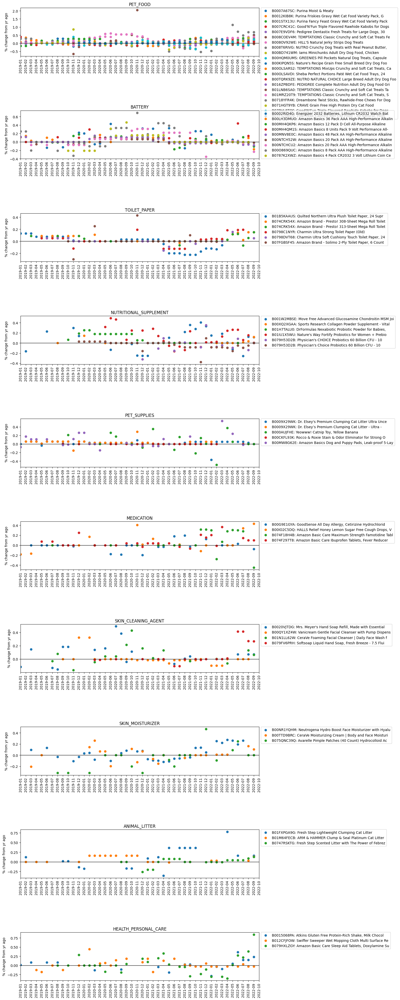

In [967]:
fig, axes = plt.subplots(len(top_cats), 1, figsize=(16,4*len(top_cats)))
for i, cat in enumerate(top_cats):
    print('category: %s' % cat)
    ax = axes[i]
    ax.set_title(cat)
    xmin = '2019-01'
    xmax = '2022-10'
    for (k, prices) in prices_dict.items():
        if product_cat_mapping[k[0]] is not cat:
            continue
        label = ('%s: %s' % (k[0], k[1][:50]))
        #print(label)
        ax.scatter(prices.index, prices['12 mo inflation'], label=label)
    [tick.set_rotation(90) for tick in ax.get_xticklabels()]
    ax.set_ylabel('% change from yr ago')
    ax.set_xlim(xmin, xmax)
    ax.hlines(y=0, xmin=xmin, xmax=xmax, linewidth=1, color='black')
    _ = ax.legend(bbox_to_anchor=(1, 1.04)) 
plt.tight_layout()

### Inflation indicators by tracking categories

Given noisy data, here we take another approach:

Track prices across a category rather than following specific products. Start with specific categories that we can compare to known CPI/inflation data. e.g. PET_FOOD, APPAREL

- get monthly timeseries of median price

In [1128]:
# categories monthly order
cmo = (
    agg_purchases_df.groupby(
        ['Category', 'yyyy-mm']
    ).agg({'Order Date': 'count', 'Title': 'nunique', 'unit price': 'median'})
    .rename(columns={'Order Date':'count', 'Title': 'unique product titles','unit price':'median price'})
    .reset_index().sort_values(['yyyy-mm','count'], ascending=False)
)
cmo.head()

,Category,yyyy-mm,count,unique product titles,median price
140,ABIS_BOOK,2022-09,519,502,11.99
42979,PET_FOOD,2022-09,445,359,14.99
40138,NUTRITIONAL_SUPPLEMENT,2022-09,284,257,19.97
51124,SHIRT,2022-09,266,229,19.90
29942,HEALTH_PERSONAL_CARE,2022-09,226,212,11.99


In [1129]:
cmo.describe()

,count,unique product titles,median price
count,66347.000000,66347.000000,66347.000000
mean,12.179857,10.961415,28.870236
std,33.294259,29.864525,56.741502
min,1.000000,0.000000,0.110000
25%,2.000000,2.000000,9.990000
50%,4.000000,4.000000,14.990000
75%,11.000000,10.000000,25.732500
max,1408.000000,1265.000000,2599.990000


In [1130]:
# restrict to rows where count of category + month is >= X
cmo12 = cmo[cmo['count']>=12]
cmo9 = cmo[cmo['count']>=9]
cmo12.describe()

,count,unique product titles,median price
count,15550.000000,15550.000000,15550.000000
mean,40.205466,35.648296,17.231911
std,60.651948,54.657299,23.324963
min,12.000000,2.000000,0.850000
25%,16.000000,14.000000,9.980000
50%,23.000000,21.000000,13.065000
75%,42.000000,38.000000,18.903750
max,1408.000000,1265.000000,724.495000


In [1131]:
# How many months of data?
cat_months_counts_df = (cmo.groupby(['Category'])['yyyy-mm']
 .nunique().to_frame().reset_index()
 .sort_values('yyyy-mm', ascending=False)
)
cat_months_counts_df['yyyy-mm'].describe()

count    1770.000000
mean       37.484181
std        19.400659
min         1.000000
25%        21.000000
50%        44.000000
75%        56.000000
max        57.000000
Name: yyyy-mm, dtype: float64

75% of the categories have at least 56 months of data!

In [1132]:
# How many months of data?
(cmo9.groupby(['Category'])['yyyy-mm']
 .nunique().to_frame().reset_index()
 .sort_values('yyyy-mm', ascending=False)
)['yyyy-mm'].describe()

count    786.000000
mean      25.311705
std       21.069452
min        1.000000
25%        4.000000
50%       21.000000
75%       47.000000
max       57.000000
Name: yyyy-mm, dtype: float64

In [1165]:
def add_inflation(df, index=yyyy_mm_list_2022_09):
    df = df.reindex(index) # incase do not have all year-months of data
    df['12 mo inflation'] = 100*(
        (df['median price'] - df.shift(12)['median price'])/df.shift(12)['median price']
    ).round(3)
    return df

def get_category_prices_df(cmo, category):
    return add_inflation(cmo[cmo['Category']==category].drop('Category',axis=1).set_index('yyyy-mm'))

PET FOOD

Good news:
- has all months of data
- with more than 182 orders each month

In [1166]:
petfood = get_category_prices_df(cmo, 'PET_FOOD')
print('%s months of pet food data' % len(petfood))
print(petfood.describe())
petfood.head(3)

57 months of pet food data
            count  unique product titles  median price  12 mo inflation
count   57.000000              57.000000     57.000000        45.000000
mean   350.596491             278.175439     13.778158         3.188889
std     99.526533              70.780123      0.892102         8.954385
min    182.000000             155.000000     11.990000       -17.300000
25%    240.000000             205.000000     13.090000        -2.200000
50%    391.000000             308.000000     13.800000         3.400000
75%    425.000000             333.000000     14.260000         7.100000
max    514.000000             387.000000     15.840000        24.000000


,count,unique product titles,median price,12 mo inflation
yyyy-mm,,,,
2018-01,215,180,12.39,NaN
2018-02,198,165,12.70,NaN
2018-03,231,193,13.20,NaN


In [1167]:
def plot_cat_inflation(df, cat, ax=None):
    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(16,4))
    xmin = '2019-01'
    xmax = '2022-10'
    ax.set_title(cat)
    ax.plot(df.index, df['12 mo inflation'])
    [tick.set_rotation(90) for tick in ax.get_xticklabels()]
    ax.set_ylabel('% change from yr ago')
    ax.set_xlim(xmin, xmax)
    _ = ax.hlines(y=0, xmin=xmin, xmax=xmax, linewidth=1, color='black')

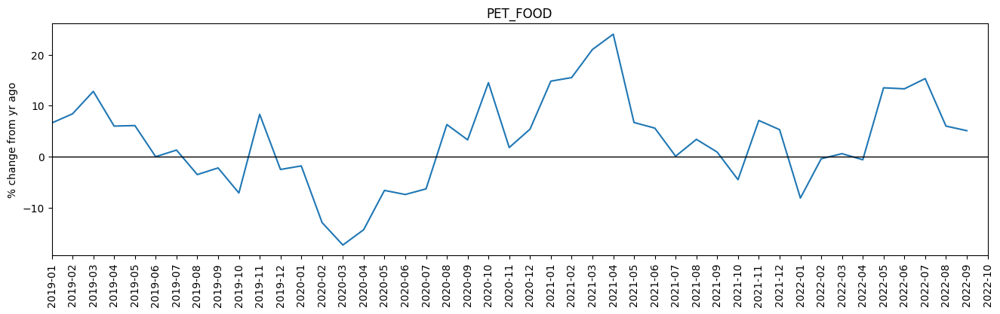

In [1168]:
plot_cat_inflation(petfood, 'PET_FOOD')

That didn't work.
Comparison: https://fred.stlouisfed.org/series/CUSR0000SS61031#0

Look at shoes

In [1169]:
shoes_df = agg_purchases_df[agg_purchases_df['Category']=='SHOES']
shoes_df.head(3)

,Order Date,Purchase Price Per Unit,Quantity,Shipping Address State,Title,ASIN/ISBN (Product Code),Category,Survey ResponseID,unit price,total price,yyyy-mm,state
11,2018-02-13,$25.99,1.0,NY,Ollio Women's Shoe Classic Lace Up Dress Low F...,B075NMM97C,SHOES,R_1Nnv2IYQFpUwHrr,25.99,25.99,2018-02,NY
27,2018-07-16,$55.99,1.0,NY,adidas Women's The Cloudfoam Pure Running Shoe,B071Z71BXW,SHOES,R_1Nnv2IYQFpUwHrr,55.99,55.99,2018-07,NY
29,2018-07-19,$52.95,1.0,NY,adidas Women's The Cloudfoam Pure Running Shoe,B0714BF87W,SHOES,R_1Nnv2IYQFpUwHrr,52.95,52.95,2018-07,NY


In [1170]:
print('%s distinct product titles in SHOES\n' % shoes_df['Title'].nunique())
print('note there are items in the shoes category that are not shoes\n')
print(shoes_df['Title'].value_counts().head())

3754 distinct product titles in SHOES

note there are items in the shoes category that are not shoes

Amazon Essentials Women's Belice Ballet Flat                                      41
Crocs Unisex-Adult Classic Clogs                                                  33
Shoe Goo Repair Adhesive for Fixing Worn Shoes or Boots, Clear, 3.7-Ounce Tube    31
Crocs Unisex-Adult Classic Clogs (Best Sellers)                                   26
Skechers Women's Go Joy Walking Shoe Sneaker                                      26
Name: Title, dtype: int64


In [1171]:
shoes = get_category_prices_df(cmo, 'SHOES')
print('%s months of shoes data' % len(shoes))
print(shoes.describe())
shoes.head(3)

57 months of shoes data
            count  unique product titles  median price  12 mo inflation
count   57.000000              57.000000     57.000000        45.000000
mean   106.736842              94.508772     37.457895         3.811111
std     23.925872              19.611515      4.337977        15.833928
min     56.000000              49.000000     27.990000       -25.200000
25%     92.000000              82.000000     34.820000        -4.700000
50%    106.000000              96.000000     36.990000         2.500000
75%    123.000000             106.000000     39.970000        14.100000
max    165.000000             138.000000     53.000000        40.200000


,count,unique product titles,median price,12 mo inflation
yyyy-mm,,,,
2018-01,57,53,29.99,NaN
2018-02,56,49,36.97,NaN
2018-03,77,69,33.99,NaN


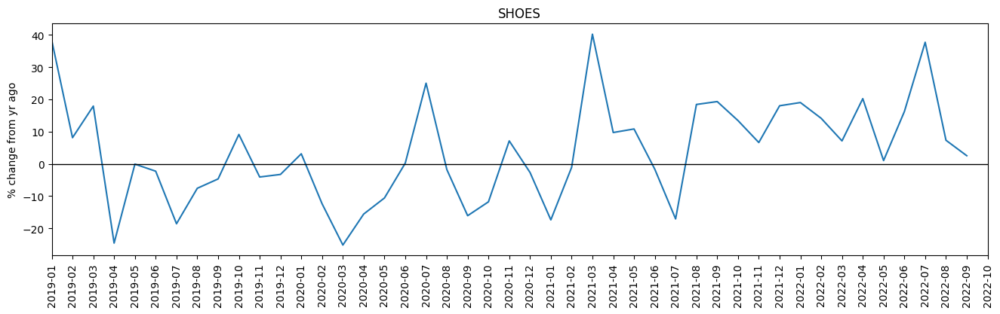

In [1172]:
plot_cat_inflation(shoes, 'SHOES')

57 months of data
            count  unique product titles  median price  12 mo inflation
count   57.000000              57.000000     57.000000        45.000000
mean   220.070175             184.631579     17.176228         5.180000
std     85.231378              67.865842      1.293856         6.397002
min     73.000000              71.000000     14.990000        -5.900000
25%    158.000000             133.000000     16.000000         0.000000
50%    212.000000             176.000000     16.990000         6.200000
75%    289.000000             234.000000     17.990000        11.600000
max    393.000000             321.000000     19.990000        17.100000


,count,unique product titles,median price,12 mo inflation
yyyy-mm,,,,
2018-01,84,79,15.935,NaN
2018-02,82,76,14.990,NaN
2018-03,105,97,15.990,NaN


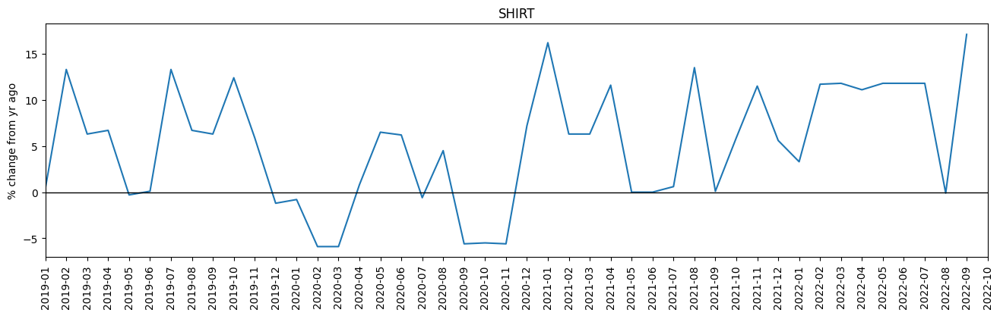

In [1173]:
shirt = get_category_prices_df(cmo, 'SHIRT')
print('%s months of data' % len(shirt))
print(shirt.describe())
plot_cat_inflation(shirt, 'SHIRT')
shirt.head(3)

57 months of data
            count  unique product titles  median price  12 mo inflation
count   57.000000              57.000000     57.000000        45.000000
mean   128.789474             103.719298     22.195877         6.926667
std     49.655145              37.004707      2.302923        11.936963
min     47.000000              41.000000     15.990000       -20.700000
25%     84.000000              73.000000     20.000000        -1.400000
50%    133.000000             104.000000     22.670000         5.600000
75%    163.000000             131.000000     23.990000        15.800000
max    230.000000             184.000000     26.915000        35.300000


,count,unique product titles,median price,12 mo inflation
yyyy-mm,,,,
2018-01,73,62,16.51,NaN
2018-02,75,70,18.99,NaN
2018-03,65,57,15.99,NaN


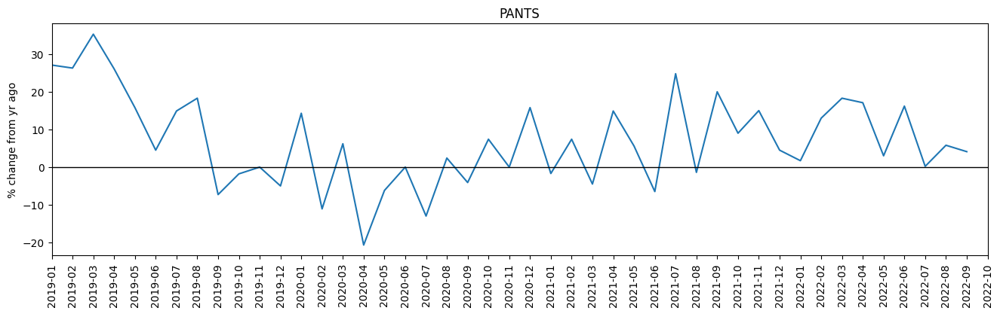

In [1174]:
pants = get_category_prices_df(cmo, 'PANTS')
print('%s months of data' % len(pants))
print(pants.describe())
plot_cat_inflation(pants, 'PANTS')
pants.head(3)

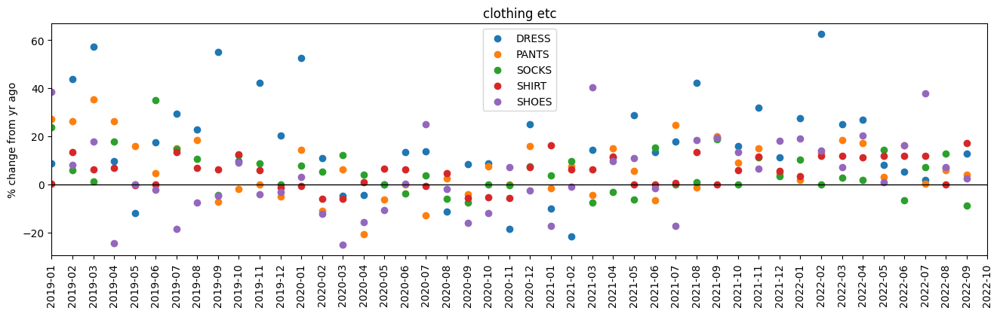

In [1188]:
# clothing
cats = ['DRESS','PANTS','SOCKS','SHIRT','SHOES']
fig, ax = plt.subplots(1, 1, figsize=(16,4))
xmin = '2019-01'
xmax = '2022-10'
ax.set_title('clothing etc')
for cat in cats:
    df = get_category_prices_df(cmo, cat)
    ax.scatter(df.index, df['12 mo inflation'], label=cat)
[tick.set_rotation(90) for tick in ax.get_xticklabels()]
ax.set_ylabel('% change from yr ago')
ax.set_xlim(xmin, xmax)
_ = ax.hlines(y=0, xmin=xmin, xmax=xmax, linewidth=1, color='black')
_ = ax.legend()

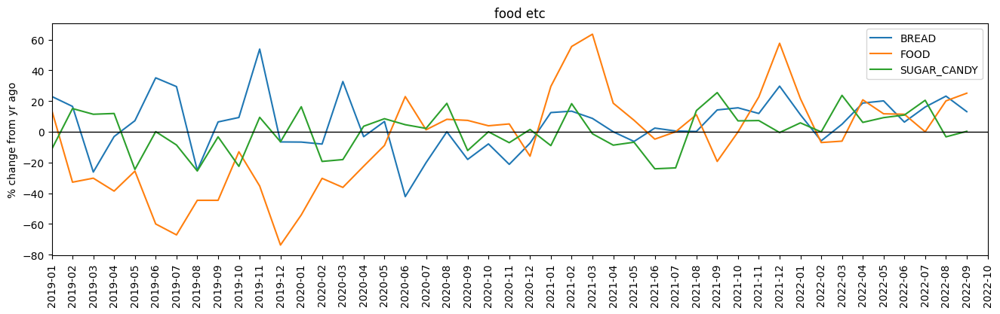

In [1187]:
fig, ax = plt.subplots(1, 1, figsize=(16,4))
xmin = '2019-01'
xmax = '2022-10'
ax.set_title('food etc')
for cat in ['BREAD','FOOD','SUGAR_CANDY']:# too volatile,'MEAT','VEGETABLE','FRUIT']:
# for cat in ['BREAD','FOOD','MEAT','VEGETABLE','FRUIT','SNACK_CHIP_AND_CRISP']:
    df = get_category_prices_df(cmo, cat)
    ax.plot(df.index, df['12 mo inflation'], label=cat)
[tick.set_rotation(90) for tick in ax.get_xticklabels()]
ax.set_ylabel('% change from yr ago')
ax.set_xlim(xmin, xmax)
_ = ax.hlines(y=0, xmin=xmin, xmax=xmax, linewidth=1, color='black')
_ = ax.legend()

In [1152]:
cmo.head(40)

,Category,yyyy-mm,count,unique product titles,median price
140,ABIS_BOOK,2022-09,519,502,11.990
42979,PET_FOOD,2022-09,445,359,14.990
40138,NUTRITIONAL_SUPPLEMENT,2022-09,284,257,19.970
51124,SHIRT,2022-09,266,229,19.900
29942,HEALTH_PERSONAL_CARE,2022-09,226,212,11.990
37172,MEDICATION,2022-09,212,188,10.230
41598,PANTS,2022-09,198,157,24.985
20657,ELECTRONIC_CABLE,2022-09,180,164,9.990
27413,GROCERY,2022-09,162,141,5.585
11582,CELLULAR_PHONE_CASE,2022-09,155,145,15.980


In [1159]:
df = agg_purchases_df[agg_purchases_df['Category']=='FOOD']
print('%s distinct product titles\n' % df['Title'].nunique())
print(df['Title'].value_counts().head(10))

1646 distinct product titles

Kraft Easy Mac Original Macaroni & Cheese Microwavable Dinner (18 ct Packets)                              43
Kraft Original Flavor Macaroni and Cheese Meal (7.25 oz Boxes, Pack of 5)                                  37
Idahoan Mashed Potatoes, Buttery Homestyle, 4-Ounce Package                                                35
Idahoan Mashed Potatoes, Roasted Garlic, 4 oz                                                              34
Beecher's World's Best Mac & Cheese, 20 oz (Frozen)                                                        34
Reser's, Macaroni Salad, 16 oz                                                                             32
Cedar's Original Hommus, 16 Oz                                                                             31
Terrasoul Superfoods Premium Nutritional Yeast Flakes, 16oz - Fortified | Gluten Free | Non-GMO | Vegan    28
Snack Pack Chocolate and Vanilla Pudding Cups Family Pack, 12 Count (Pack of 1)           

In [550]:
agg_purchases_df.head()

,Order Date,Purchase Price Per Unit,Quantity,Shipping Address State,Title,ASIN/ISBN (Product Code),Category,Survey ResponseID,unit price,total price,yyyy-mm,state
0,2018-02-21,$7.93,1.0,RHODE ISLAND,Suburban World: The Norling Photos,0873516095,ABIS_BOOK,R_3I9Pu8iauEcOx9A,7.93,7.93,2018-02,RI
1,2018-02-21,$3.53,1.0,RHODE ISLAND,NaN,B004S7EZR0,NaN,R_3I9Pu8iauEcOx9A,3.53,3.53,2018-02,RI
2,2018-03-05,$5.99,1.0,RHODE ISLAND,1952 Back In The Day - 24-page Greeting Card /...,193938012X,ABIS_BOOK,R_3I9Pu8iauEcOx9A,5.99,5.99,2018-03,RI
3,2018-04-04,$23.85,1.0,RHODE ISLAND,Adeco Decorative Wood Wall Hanging Picture Fra...,B00DGYHIMU,PICTURE_FRAME,R_3I9Pu8iauEcOx9A,23.85,23.85,2018-04,RI
4,2018-04-29,$4.50,1.0,RHODE ISLAND,Time of Wonder (Picture Puffins),0140502017,ABIS_BOOK,R_3I9Pu8iauEcOx9A,4.50,4.50,2018-04,RI


## Investigating data quirks

Q: How often do items with the same product code have multiple titles or multiple categories?

In [511]:
ti_unique = top_items.reset_index().groupby([
    'ASIN/ISBN (Product Code)', 'count'
]).nunique().sort_values(ascending=False, by='Title').reset_index()
ti_unique.head()

,ASIN/ISBN (Product Code),count,Title,Category
0,B077CXGSJW,1,4,1
1,B076DSRB6B,1,3,1
2,B00LNG91UU,1,3,1
3,B00HUWJ3P4,1,3,1
4,B013YRRFJ4,1,3,1


In [512]:
print('%s product codes with multiple categories\n' % (ti_unique['Category']>1).sum())
print('number of categories per item: distribution')
print(ti_unique['Category'].describe())

1222 product codes with multiple categories

number of categories per item: distribution
count    472664.000000
mean          1.002602
std           0.051277
min           1.000000
25%           1.000000
50%           1.000000
75%           1.000000
max           3.000000
Name: Category, dtype: float64


In [513]:
print('%s product codes with multiple titles\n' % (ti_unique['Title']>1).sum())
print('number of titles per item: distribution')
print(ti_unique['Title'].describe())

2777 product codes with multiple titles

number of titles per item: distribution
count    472664.000000
mean          1.005958
std           0.078048
min           1.000000
25%           1.000000
50%           1.000000
75%           1.000000
max           4.000000
Name: Title, dtype: float64


Q: What is the importance of this w.r.t. our dataset size?

In our dataset:
- what fraction of unique product codes have multiple titles?
- what fraction of unique product codes have multiple categories?
- what fraction of the total purchases are for items that have multiple titles?
- what fraction of the total purchaes are for items that have multiple categories?

In [531]:
print('What fraction of unique product codes have multiple titles?')
print('A: %0.4f' % ((ti_unique['Title']>1).sum()/len(ti_unique)))

print('What fraction of unique product codes have multiple categories?')
print('A: %0.4f' % ((ti_unique['Category']>1).sum()/len(ti_unique)))

print('What fraction of the total purchases are for items that have multiple titles?')
print('A: %0.4f' % (ti_unique[ti_unique['Title']>1]['count'].sum()/ti_unique['count'].sum()))

print('What fraction of the total purchases are for items that have multiple categories?')
print('A: %0.4f' % (ti_unique[ti_unique['Category']>1]['count'].sum()/ti_unique['count'].sum()))

What fraction of unique product codes have multiple titles?
A: 0.0059
What fraction of unique product codes have multiple categories?
A: 0.0026
What fraction of the total purchases are for items that have multiple titles?
A: 0.0046
What fraction of the total purchases are for items that have multiple categories?
A: 0.0019


### Closer inspection

Make a df for just the items with multiple categories or titles, merged with the rest of the purchases data.

In [514]:
# make a dataframe with the items that have multiple titles or multiple categories
multi_items_count = ((ti_unique['Title']>1) | (ti_unique['Category']>1)).sum()
print('%s items with multiple items or categories' % multi_items_count)
multi_items_df = ti_unique[((ti_unique['Title']>1) | (ti_unique['Category']>1))]
multi_items_df.head()

3868 items with multiple items or categories


,ASIN/ISBN (Product Code),count,Title,Category
0,B077CXGSJW,1,4,1
1,B076DSRB6B,1,3,1
2,B00LNG91UU,1,3,1
3,B00HUWJ3P4,1,3,1
4,B013YRRFJ4,1,3,1


In [515]:
multi_items_df = multi_items_df.merge(
    agg_purchases_df, how='inner', on='ASIN/ISBN (Product Code)',
    suffixes=['_count', '']
)
multi_items_df.head()

,ASIN/ISBN (Product Code),count,Title_count,Category_count,Order Date,Purchase Price Per Unit,Quantity,Shipping Address State,Title,Category,Survey ResponseID,unit price,total price,yyyy-mm,state
0,B077CXGSJW,1,4,1,2019-12-16,$33.95,1.0,AZ,Konquest KBP-2704A Automatic Upper Arm Blood P...,BLOOD_PRESSURE_MONITOR,R_BPpVPmbTpGsXK1z,33.95,33.95,2019-12,AZ
1,B077CXGSJW,1,4,1,2022-03-27,$35.88,1.0,CA,Konquest KBP-2704A Automatic Upper Arm Blood P...,BLOOD_PRESSURE_MONITOR,R_247Ax9cFFZftmdh,35.88,35.88,2022-03,CA
2,B077CXGSJW,1,4,1,2019-11-19,$33.95,1.0,CT,Konquest KBP-2704A Automatic Upper Arm Blood P...,BLOOD_PRESSURE_MONITOR,R_20M6h8zoTN9Ddxq,33.95,33.95,2019-11,CT
3,B077CXGSJW,1,4,1,2019-06-05,$29.95,1.0,IL,Konquest KBP-2704A Automatic Upper Arm Blood P...,BLOOD_PRESSURE_MONITOR,R_3I0K5JAKywca6PU,29.95,29.95,2019-06,IL
4,B077CXGSJW,1,4,1,2020-10-07,$36.95,1.0,IL,Konquest KBP-2704A Automatic Upper Arm Blood P...,BLOOD_PRESSURE_MONITOR,R_2qxZ0v6uaLBRkV7,36.95,36.95,2020-10,IL


In [516]:
len(multi_items_df)

11335

Q: How do categories change?

Examples that don't seem like oddities:
- HEALTH_PERSONAL_CARE > MASSAGER > SEXUAL_STIMULATION_DEVICE
- GROCERY > VEGETABLE > FOOD
- GROCERY > CANDY > FOOD

In [422]:
multi_items_df[multi_items_df['Category_count']>1].sort_values(
    ['Category_count', 'ASIN/ISBN (Product Code)', 'Order Date'], ascending=False
).head(20)

,ASIN/ISBN (Product Code),count,Title_count,Category_count,Order Date,Purchase Price Per Unit,Quantity,Shipping Address State,Title,Category,Survey ResponseID,unit price,total price,yyyy-mm,state
8770,B07S9FMPD2,1,1,3,2022-01-13,$39.95,1.0,VA,Turtle Beach Recon Spark Gaming Headset for Xb...,HEADPHONES,R_XSQ0rtJL82sO48h,39.95,39.95,2022-01,VA
8771,B07S9FMPD2,1,1,3,2021-02-05,$49.95,1.0,NY,Turtle Beach Recon Spark Gaming Headset for Xb...,VIDEO_GAME_ACCESSORIES,R_1OpBOVBIiQpQOdY,49.95,49.95,2021-02,NY
8772,B07S9FMPD2,1,1,3,2020-12-11,$39.95,1.0,IL,Turtle Beach Recon Spark Gaming Headset for Xb...,PHYSICAL_VIDEO_GAME_SOFTWARE,R_R4fpnxUUupS13Mt,39.95,39.95,2020-12,IL
8506,B07Q8G5LW9,1,1,3,2022-03-29,$129.95,1.0,NC,Vibratex Original Magic Wand Rechargeable Cord...,SEXUAL_STIMULATION_DEVICE,R_1NfxGiJddqHvUUI,129.95,129.95,2022-03,NC
8505,B07Q8G5LW9,1,1,3,2021-08-08,$114.95,1.0,NY,Vibratex Original Magic Wand Rechargeable Cord...,MASSAGER,R_2AFgFpz54dta2Rq,114.95,114.95,2021-08,NY
8504,B07Q8G5LW9,1,1,3,2019-10-14,$99.95,1.0,MS,Vibratex Original Magic Wand Rechargeable Cord...,HEALTH_PERSONAL_CARE,R_22tZfZkw9b1zxls,99.95,99.95,2019-10,MS
8559,B07MTPXV21,1,1,3,2021-11-18,$11.94,1.0,WI,3 Cans Neon 11X Butane Refill Fuel Fluid Light...,PESTICIDE,R_3G2FrnXm2CdS0gc,11.94,11.94,2021-11,WI
8561,B07MTPXV21,1,1,3,2021-08-07,$12.05,1.0,MN,3 Cans Neon 11X Butane Refill Fuel Fluid Light...,MECHANICAL_LIGHTER,R_AbNNlwZIzJdqqVH,12.05,12.05,2021-08,MN
8560,B07MTPXV21,1,1,3,2021-05-29,$11.10,1.0,IL,3 Cans Neon 11X Butane Refill Fuel Fluid Light...,LIGHTER_FLUID,R_3KE0mQaK5xihhMb,11.10,11.10,2021-05,IL
10747,B074J5KFCQ,1,1,3,2020-04-28,$1.69,2.0,VA,"365 by Whole Foods Market, Tomatoes Crushed Wi...",FOOD,R_1lo5uRr9KHuBy90,1.69,3.38,2020-04,VA


Q: What are the categories that have been recategorized most often?

Q: What are the categories that are recategorized the most in terms of unique items?

- Beauty and personal health
- A lot of food related products

In [409]:
(multi_items_df[multi_items_df['Category_count']>1]
 .groupby(['Category','ASIN/ISBN (Product Code)'])
)['count'].count().reset_index()['Category'].value_counts().head(30)

GROCERY                         138
HEALTH_PERSONAL_CARE            122
BEAUTY                           90
TOYS_AND_GAMES                   65
KITCHEN                          62
HOME                             46
PET_SUPPLIES                     45
FOOD                             43
OUTDOOR_LIVING                   25
NUTRITIONAL_SUPPLEMENT           24
PHYSICAL_VIDEO_GAME_SOFTWARE     22
SPORTING_GOODS                   21
MEDICATION                       20
OFFICE_PRODUCTS                  20
TOY_FIGURE                       20
HEADPHONES                       18
WIRELESS_ACCESSORY               17
CONSOLE_VIDEO_GAMES              16
VEGETABLE                        15
SKIN_MOISTURIZER                 15
BABY_PRODUCT                     14
HERBAL_SUPPLEMENT                13
ELECTRONIC_CABLE                 13
OUTDOOR_RECREATION_PRODUCT       12
TOOLS                            11
ART_SUPPLIES                     11
PET_TOY                          11
DAIRY_BASED_CHEESE          

Q: What are the categories that are recategorized and involved in the most purchases?

In [414]:
(multi_items_df[multi_items_df['Category_count']>1]['Category'].value_counts()).head(20)

GROCERY                         211
HEALTH_PERSONAL_CARE            180
BEAUTY                          111
KITCHEN                          76
TOYS_AND_GAMES                   76
FOOD                             75
PET_SUPPLIES                     62
HOME                             54
SKIN_BLEMISH_REMOVAL_TOOL        40
MEDICATION                       38
NUTRITIONAL_SUPPLEMENT           35
OUTDOOR_LIVING                   31
SKIN_MOISTURIZER                 31
HERBAL_SUPPLEMENT                29
OFFICE_PRODUCTS                  28
SPORTING_GOODS                   26
PHYSICAL_VIDEO_GAME_SOFTWARE     25
HEADPHONES                       23
WIRELESS_ACCESSORY               22
CONSOLE_VIDEO_GAMES              21
Name: Category, dtype: int64

The top categories are pretty much the same no matter how you count.

In [419]:
print('Most recategoriezed categories by unique items')
print((multi_items_df[multi_items_df['Category_count']>1]
 .groupby(['Category','ASIN/ISBN (Product Code)'])
)['count'].count().reset_index()['Category'].value_counts().head(8))

print('\nMost recategoriezed categories by  categories by purchases')
print((multi_items_df[multi_items_df['Category_count']>1]['Category'].value_counts()).head(8))

Most recategoriezed categories by unique items
GROCERY                 138
HEALTH_PERSONAL_CARE    122
BEAUTY                   90
TOYS_AND_GAMES           65
KITCHEN                  62
HOME                     46
PET_SUPPLIES             45
FOOD                     43
Name: Category, dtype: int64

Most recategoriezed categories by  categories by purchases
GROCERY                 211
HEALTH_PERSONAL_CARE    180
BEAUTY                  111
KITCHEN                  76
TOYS_AND_GAMES           76
FOOD                     75
PET_SUPPLIES             62
HOME                     54
Name: Category, dtype: int64


Was there a time when some of these categories were phased in and out?

e.g. because a category was broken out into subcategories? (e.g. GROCERY too broad?)

What is the difference between FOOD and GROCERY?



In [424]:
# Inspect Grocery

multi_items_df[multi_items_df['Category']=='GROCERY']['yyyy-mm'].min()

'2018-02'

In [474]:
multi_cats = multi_items_df[multi_items_df['Category_count']>1]['Category'].unique()
len(multi_cats)
multi_cats_dates_df = pd.DataFrame({
    'category': multi_cats,
    'min yyyy-mm': [multi_items_df[multi_items_df['Category']==c]['yyyy-mm'].min() for c in multi_cats],
    'max yyyy-mm': [multi_items_df[multi_items_df['Category']==c]['yyyy-mm'].max() for c in multi_cats],
    'count': [(multi_items_df['Category']==c).sum() for c in multi_cats],
})

These might represent new categories that items were then recategorized to

In [477]:
multi_cats_dates_df.sort_values(by=['min yyyy-mm', 'count'], ascending=False).head(10)

,category,min yyyy-mm,max yyyy-mm,count
160,POTPOURRI_SACHET,2022-08,2022-08,1
6,DIETARY_SUPPLEMENTS,2022-07,2022-07,1
338,ELECTRONIC_COMPONENT_TERMINAL,2022-07,2022-07,1
537,SPORT_BAT,2022-07,2022-07,1
592,GARMENT_PROTECTOR_COVER,2022-07,2022-07,1
603,STETHOSCOPE,2022-07,2022-07,1
612,VALVE,2022-07,2022-07,1
354,TRACK_SUIT,2022-06,2022-06,1
357,VIDEO_GAME,2022-06,2022-06,1
360,PALETTE_PUTTY_KNIFE,2022-06,2022-06,1


These might represent phased out categories that items were recategorized from

In [478]:
multi_cats_dates_df.sort_values(by='max yyyy-mm').head(10)

,category,min yyyy-mm,max yyyy-mm,count
425,INTERNAL_MEMORY,2018-02,2018-02,1
651,WEATHER_STATION,2018-02,2018-02,1
655,ELLIPTICAL_TRAINER,2018-02,2018-02,1
11,TRAMPOLINE,2018-03,2018-03,1
653,LADDER,2018-03,2018-03,1
532,BUCKET,2018-05,2018-05,1
509,SURVEILANCE_SYSTEMS,2018-05,2018-05,1
471,CRAFT_HOOP_FRAME,2018-05,2018-05,1
515,TOY_STROLLER,2018-06,2018-06,1
668,WALL_PLATE,2018-06,2018-06,1


Q: What are the the most common categories for the items with multiple titles?

In [440]:
multi_items_df[multi_items_df['Title_count']>1]['Category'].value_counts().head(20)

PET_FOOD                            565
PET_SUPPLIES                        398
PET_TOY                             188
ELECTRONIC_CABLE                    180
NUTRITIONAL_SUPPLEMENT              152
HEALTH_PERSONAL_CARE                110
PET_ACTIVITY_STRUCTURE               98
HEADPHONES                           93
WASTE_BAG                            88
MEDICATION                           83
PAPER_TOWEL                          82
ABIS_BOOK                            80
SKIN_MOISTURIZER                     78
PET_PEST_CONTROL                     78
HERBAL_SUPPLEMENT                    76
PORTABLE_ELECTRONIC_DEVICE_MOUNT     75
PET_BED_MAT                          73
SNACK_FOOD_BAR                       72
MARKING_PEN                          72
COMPUTER_DRIVE_OR_STORAGE            71
Name: Category, dtype: int64

Q: What are the title transitions like? Do they represent shrinkflation?

Follow some top products across their title changes.

In [484]:
multi_items_df[multi_items_df['Title_count']>1].groupby(
    ['ASIN/ISBN (Product Code)', 'Title']
).count()#.to_frame()#.sort_values('count',ascending=False).head()

count  \
ASIN/ISBN (Product Code) Title                                                       
0062404261               Pete the Cat: Snow Daze (My First I Can Read)           1   
                         Pete the Cat: Snow Daze: A Winter and Holiday B...      1   
0062566962               Pinkalicious and the Amazing Sled Run (I Can Re...      1   
                         Pinkalicious and the Amazing Sled Run: A Winter...      1   
0439358078               Harry Potter and the Order of the Phoenix               1   
...                                                                            ...   
B09YKYG6W8               Ultra Strong Clean Touch Toilet Paper, 18 Famil...      1   
B09YPQ5RZ4               Inselks Solar Spot Lights Outdoor, Solar Outdoo...      1   
                         Solar Spot Lights Outdoor, Inselks Solar Outdoo...      1   
B0B3HVPSL7               1080P Baby Car Mirror, Shybaby 4.3" Baby Car Ca...      1   
                         1080P Baby Car Mirror, Shybaby 4.3'' Baby Car C...      1   

                                                                             Title_count  \
ASIN/ISBN (Product Code) Title                                                             
0062404261               Pete the Cat: Snow Daze (My First I Can Read)                 1   
                         Pete the Cat: Snow Daze: A Winter and Holiday B...            1   
0062566962               Pinkalicious and the Amazing Sled Run (I Can Re...            1   
                         Pinkalicious and the Amazing Sled Run: A Winter...            1   
0439358078               Harry Potter and the Order of the Phoenix                     1   
...                                                                                  ...   
B09YKYG6W8               Ultra Strong Clean Touch Toilet Paper, 18 Famil...            1   
B09YPQ5RZ4               Inselks Solar Spot Lights Outdoor, Solar Outdoo...            1   
                         Solar Spot Lights Outdoor, Inselks Solar Outdoo...            1   
B0B3HVPSL7               1080P Baby Car Mirror, Shybaby 4.3" Baby Car Ca...            1   
                         1080P Baby Car Mirror, Shybaby 4.3'' Baby Car C...            1   

                                                                             Category_count  \
ASIN/ISBN (Product Code) Title                                                                
0062404261               Pete the Cat: Snow Daze (My First I Can Read)                    1   
                         Pete the Cat: Snow Daze: A Winter and Holiday B...               1   
0062566962               Pinkalicious and the Amazing Sled Run (I Can Re...               1   
                         Pinkalicious and the Amazing Sled Run: A Winter...               1   
0439358078               Harry Potter and the Order of the Phoenix                        1   
...                                                                                     ...   
B09YKYG6W8               Ultra Strong Clean Touch Toilet Paper, 18 Famil...               1   
B09YPQ5RZ4               Inselks Solar Spot Lights Outdoor, Solar Outdoo...               1   
                         Solar Spot Lights Outdoor, Inselks Solar Outdoo...               1   
B0B3HVPSL7               1080P Baby Car Mirror, Shybaby 4.3" Baby Car Ca...               1   
                         1080P Baby Car Mirror, Shybaby 4.3'' Baby Car C...               1   

                                                                             Order Date  \
ASIN/ISBN (Product Code) Title                                                            
0062404261               Pete the Cat: Snow Daze (My First I Can Read)                1   
                         Pete the Cat: Snow Daze: A Winter and Holiday B...           1   
0062566962               Pinkalicious and the Amazing Sled Run (I Can Re...           1   
                         Pinkalicious and the Amazing Sled Run: A Wint

In [466]:
multi_items_df.head()

,ASIN/ISBN (Product Code),count,Title_count,Category_count,Order Date,Purchase Price Per Unit,Quantity,Shipping Address State,Title,Category,Survey ResponseID,unit price,total price,yyyy-mm,state
0,B077CXGSJW,1,4,1,2019-12-16,$33.95,1.0,AZ,Konquest KBP-2704A Automatic Upper Arm Blood P...,BLOOD_PRESSURE_MONITOR,R_BPpVPmbTpGsXK1z,33.95,33.95,2019-12,AZ
1,B077CXGSJW,1,4,1,2022-03-27,$35.88,1.0,CA,Konquest KBP-2704A Automatic Upper Arm Blood P...,BLOOD_PRESSURE_MONITOR,R_247Ax9cFFZftmdh,35.88,35.88,2022-03,CA
2,B077CXGSJW,1,4,1,2019-11-19,$33.95,1.0,CT,Konquest KBP-2704A Automatic Upper Arm Blood P...,BLOOD_PRESSURE_MONITOR,R_20M6h8zoTN9Ddxq,33.95,33.95,2019-11,CT
3,B077CXGSJW,1,4,1,2019-06-05,$29.95,1.0,IL,Konquest KBP-2704A Automatic Upper Arm Blood P...,BLOOD_PRESSURE_MONITOR,R_3I0K5JAKywca6PU,29.95,29.95,2019-06,IL
4,B077CXGSJW,1,4,1,2020-10-07,$36.95,1.0,IL,Konquest KBP-2704A Automatic Upper Arm Blood P...,BLOOD_PRESSURE_MONITOR,R_2qxZ0v6uaLBRkV7,36.95,36.95,2020-10,IL


In [495]:
agg_purchases_df[
    (agg_purchases_df['Title']=='Amazon Brand - Presto! 308-Sheet Mega Roll Toilet Paper, Ultra-Soft, 6 Count (Pack of 4), 24 Mega Rolls = 112 regular rolls')
].groupby('yyyy-mm').count()

,Order Date,Purchase Price Per Unit,Quantity,Shipping Address State,Title,ASIN/ISBN (Product Code),Category,Survey ResponseID,unit price,total price,state
yyyy-mm,,,,,,,,,,,
2018-05,3,3,3,3,3,3,3,3,3,3,3
2018-06,1,1,1,1,1,1,1,1,1,1,1
2018-07,2,2,2,2,2,2,2,2,2,2,2
2018-08,2,2,2,2,2,2,2,2,2,2,2
2018-09,4,4,4,4,4,4,4,4,4,4,4
2018-10,2,2,2,2,2,1,2,2,2,2,2
2018-11,1,1,1,1,1,1,1,1,1,1,1
2018-12,5,5,5,5,5,5,5,5,5,5,5
2019-01,2,2,2,2,2,2,2,2,2,2,2


In [497]:
t2 = 'Amazon Brand - Presto! 313-Sheet Mega Roll Toilet Paper, Ultra-Soft, 6 Count (Pack of 4), 24 Family Mega Rolls = 120 regular rolls'
agg_purchases_df[
    (agg_purchases_df['Title']==t2)
].groupby(['yyyy-mm', 'unit price']).count()

Order Date  Purchase Price Per Unit  Quantity  \
yyyy-mm unit price                                                  
2018-03 20.45                1                        1         1   
2018-05 20.45                1                        1         1   
2018-08 20.45                1                        1         1   
2018-11 20.45                1                        1         1   
2018-12 20.45                1                        1         1   
2019-01 20.45                1                        1         1   
        22.25                1                        1         1   
2019-02 22.25                1                        1         1   
2019-03 22.25                1                        1         1   
2019-04 22.25                3                        3         3   
2019-06 22.25                3                        3         3   
2019-07 22.25                2                        2         2   
2019-08 22.25                1                        1         1   
2019-09 22.25                1                        1         1   
2019-10 22.25                3                        3         3   
2019-12 22.25                2                        2         2   
2020-01 22.25                1                        1         1   
2020-02 22.25                3                        3         3   
2020-03 22.25                2                        2         2   
2020-04 22.25                6                        6         6   
2020-05 22.25                5                        5         5   
2020-06 22.25                4                        4         4   
2020-07 22.25                4                        4         4   
2020-08 22.25                4                        4         4   
2020-09 22.25                4                        4         4   
2020-10 22.25                5                        5         5   
2020-11 22.25                5                        5         5   
2020-12 22.25                3                        3         3   
2021-01 22.25                5                        5         5   
2021-02 22.25                2                        2         2   
2021-03 22.25                5                        5         5   
2021-04 22.25                4                        4         4   
2021-05 22.25                3                        3         3   
2021-06 22.25                5                        5         5   
2021-07 20.83                5                        5         5   
        22.25                2                        2         2   
2021-08 22.25                3                        3         3   
2021-09 22.25                5                        5         5   
2021-10 22.25                3                        3         3   
2021-11 22.25                4                        4         4   
2021-12 22.25                6                        6         6   
        26.70                1                        1         1   
2022-01 22.25                2                        2         2   
2022-02 22.25                7                        7         7   
2022-03 22.81                3                        3         3   
2022-04 22.81                7                        7         7   
2022-05 22.78                1                        1         1   
        24.91                2                        2         2   
        24.96                1                        1         1   
2022-06 24.96                3                        3         3   
        25.38                1                        1         1   
2022-07 19.39                2                        2         2   
        22.25                1                        1         1   
2022-08 22.25                1                        1         1   
        23.50                2                        2         2   
        25.61                2                        2         2   
2022-09 25.61     

In [499]:
agg_purchases_df[agg_purchases_df['ASIN/ISBN (Product Code)']=='B074CRK54X'].groupby(
    ['Title', 'yyyy-mm', 'unit price']
).count().head(50)

Order Date  \
Title                                              yyyy-mm unit price               
Amazon Brand - Presto! 308-Sheet Mega Roll Toil... 2018-05 20.45                3   
                                                   2018-06 20.45                1   
                                                   2018-07 20.45                2   
                                                   2018-08 20.45                2   
                                                   2018-09 20.45                4   
                                                   2018-10 20.45                1   
                                                   2018-11 20.45                1   
                                                   2018-12 20.45                5   
                                                   2019-01 22.25                2   
                                                   2019-02 22.25                3   
                                                   2019-03 17.80                1   
                                                           22.25                1   
                                                   2019-04 22.25                1   
                                                   2019-05 22.25                3   
                                                   2019-07 22.25                3   
                                                   2019-08 22.25                3   
                                                   2019-10 22.25                3   
                                                   2019-11 15.55                1   
                                                           22.25                3   
                                                   2019-12 22.25                1   
                                                   2020-01 22.25                6   
                                                   2020-02 19.44                1   
                                                           22.25                3   
                                                   2020-03 22.25               11   
                                                   2020-04 22.25                4   
                                                   2020-05 22.25                9   
                                                   2020-06 22.25                2   
                                                   2020-07 22.25                6   
                                                   2020-08 22.25                6   
                                                   2020-09 22.25               11   
                                                   2020-10 22.25               11   
                                                   2020-11 22.25               11   
                                                   2020-12 22.25                9   
                                                   2021-01 22.25                5   
                                                   2021-02 22.25                9   
                                                   2021-03 22.25               10   
                                                   2021-04 22.25                6   
                                                   2021-05 22.25               12   
                                                   2021-06 21.29                1   
                                                           22.25                9   
                                                   2021-07 20.83                2   
                                                           21.29                2   
                                                           22.25                4   
                                                   2021-08 22.25               10   
                                                   2021-09 22.25               13   
                                                   2021-10 22.25            

In [341]:
top_items.head()

,,,Order Date
Title,ASIN/ISBN (Product Code),Category,
"Amazon Brand - Presto! 308-Sheet Mega Roll Toilet Paper, Ultra-Soft, 6 Count (Pack of 4), 24 Mega Rolls = 112 regular rolls",B074CRK54X,TOILET_PAPER,304
"Amazon Basics 48 Pack AA High-Performance Alkaline Batteries, 10-Year Shelf Life, Easy to Open Value Pack",B00MNV8E0C,BATTERY,287
"Amazon Basics 36 Pack AAA High-Performance Alkaline Batteries, 10-Year Shelf Life, Easy to Open Value Pack",B00LH3DMUO,BATTERY,258
Fire TV Stick 4K streaming device with Alexa Voice Remote (includes TV controls) | Dolby Vision,B079QHML21,DIGITAL_DEVICE_4,233
"Echo Dot (3rd Gen, 2018 release) - Smart speaker with Alexa - Charcoal",B07FZ8S74R,DIGITAL_DEVICE_3,232
